## Issue 2 : Bulk time-based pressure change analysis #2

Time-based patterns associated with sudden and large pressure changes over multiple devices, as should occur when a class changes location or school finishes for a day.


In [42]:
import pandas as pd
dfinal = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_Final.csv')

In [43]:
dfinal

,Unnamed: 0,Unnamed: 0.1,id,nid,sgt,rts,hum,light,mode,cmode,...,mac,lat,lon,acc,time,epoch_time,TIMESTAMP,press_change,steps_change,time_change
0,1,67,181188048,709616,2016-05-24 01:41:37,2016-06-24 05:44:52,72.5,0,1,1,...,"MAC:002675c22d6c RSSI:-77,MAC:7824af9482a8 RSS...",1.316632,103.761054,93,01:41:37,1.464034e+09,1.464034e+09,0.010483,0.000000,5056.0
1,1070,93,180510505,402920,2016-05-24 02:37:45,2016-06-24 07:10:29,49.0,0,1,1,...,"MAC:32cda7397c09 RSSI:-68,MAC:10feedc31e90 RSS...",1.314916,103.761871,90,02:37:45,1.464038e+09,1.464038e+09,0.010885,0.000000,5053.0
2,2,101,181188049,709616,2016-05-24 03:05:55,2016-06-24 05:44:52,72.5,0,1,1,...,"MAC:7824af9482a8 RSSI:-80,MAC:f81a673a837e RSS...",1.315601,103.761527,147,03:05:55,1.464039e+09,1.464039e+09,0.012060,0.000000,5058.0
3,1071,128,180510506,402920,2016-05-24 04:02:02,2016-06-24 07:10:29,49.5,0,1,1,...,"MAC:32cda7397c09 RSSI:-69,MAC:10feedc31e90 RSS...",1.314916,103.761871,90,04:02:02,1.464043e+09,1.464043e+09,0.021159,0.000000,5057.0
4,3,136,181188050,709616,2016-05-24 04:30:11,2016-06-24 05:44:52,72.5,0,1,1,...,"MAC:7824af9482a8 RSSI:-74,MAC:002675c22d6c RSS...",1.315601,103.761527,147,04:30:11,1.464044e+09,1.464044e+09,0.026108,0.000000,5056.0
5,1072,167,180510507,402920,2016-05-24 05:26:18,2016-06-24 07:10:29,49.5,0,1,1,...,"MAC:32cda7397c09 RSSI:-68,MAC:10feedc31e90 RSS...",1.314916,103.761871,90,05:26:18,1.464048e+09,1.464048e+09,0.004153,0.000000,5056.0
6,1306,204,180688582,709482,2016-05-24 05:54:10,2016-06-24 03:56:13,74.0,0,6,4,...,"MAC:9094e4fc0f2c RSSI:-79,MAC:48ee0c6cbf04 RSS...",1.316000,103.763824,157,05:54:10,1.464049e+09,1.464049e+09,0.312500,0.000000,16.0
7,1307,206,180688583,709482,2016-05-24 05:54:25,2016-06-24 03:56:13,74.0,0,6,4,...,"MAC:002675aaa160 RSSI:-72,MAC:e08e3c008770 RSS...",1.315018,103.762918,128,05:54:25,1.464049e+09,1.464049e+09,2.066667,0.000000,15.0
8,4,207,181188051,709616,2016-05-24 05:54:26,2016-06-24 05:44:52,73.5,0,1,1,...,"MAC:7824af9482a8 RSSI:-77,MAC:002675c22d6c RSS...",1.315601,103.761527,147,05:54:26,1.464049e+09,1.464049e+09,0.024728,0.000000,5055.0
9,1308,210,180688585,709482,2016-05-24 05:54:58,2016-06-24 03:56:13,73.5,0,3,3,...,"MAC:d0c2826772f0 RSSI:-78,MAC:d0c2826772f6 RSS...",1.314846,103.762321,71,05:54:58,1.464049e+09,1.464049e+09,0.272727,0.333333,33.0


### mean of step change per hour

<IPython.core.display.Javascript object>


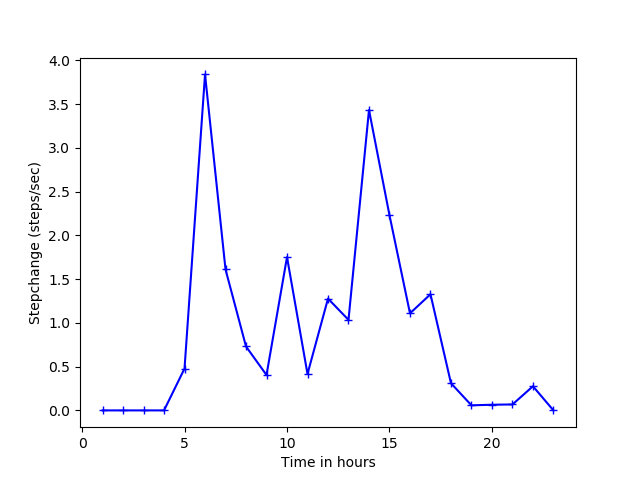

Text(0.5, 0, 'Time in hours')

In [30]:
import time
%matplotlib notebook
import matplotlib.pyplot as plt
grp = dfinal.groupby(dfinal['sgt'])
datetime = pd.to_datetime(dfinal['sgt'])
times = datetime.dt.time
dfinal['time']= times

grp = dfinal.groupby(by=[dfinal.time.map(lambda x : x.hour)]).steps_change.mean()

ax=plt.subplot(111, label="step_change")
ax.plot(grp,color = 'b',marker = '+',label="step_change")
plt.ylabel('Stepchange (steps/sec)')
plt.xlabel('Time in hours')

### sum of step changes per hour

<IPython.core.display.Javascript object>


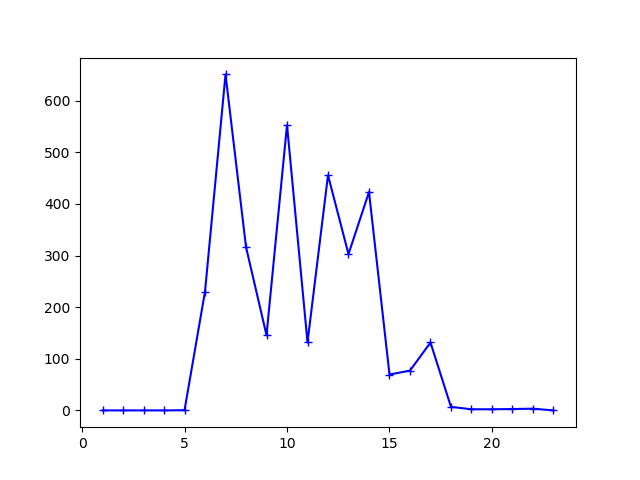

In [55]:
import time
%matplotlib notebook
import matplotlib.pyplot as plt
grp = dfinal.groupby(dfinal['sgt'])
datetime = pd.to_datetime(dfinal['sgt'])
times = datetime.dt.time
dfinal['time']= times

grp = dfinal.groupby(by=[dfinal.time.map(lambda x : x.hour)]).steps_change.sum()

ax=plt.subplot(111, label="step_change")
ax.plot(grp,color = 'b',marker = '+',label="step_change")


<IPython.core.display.Javascript object>


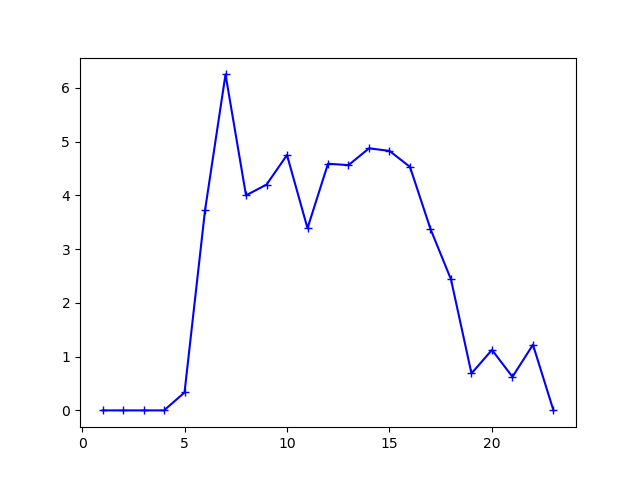

In [46]:
import time
%matplotlib notebook
import matplotlib.pyplot as plt
grp = dfinal.groupby(dfinal['sgt'])
datetime = pd.to_datetime(dfinal['sgt'])
times = datetime.dt.time
dfinal['time']= times

grp = dfinal.groupby(by=[dfinal.time.map(lambda x : x.hour)]).steps_change.max()
ax=plt.subplot(111, label="step_change")
ax.plot(grp,color = 'b',marker = '+',label="step_change")


### INFERENCE:
#### peak at 6 hrs, 10 hrs , 14 hrs
School timings from website:
7:45 to 13:55 hrs
Lunch break: 10:25 to 11:00 hrs


### II 
### plot of the peak hours narrowed down to minutes

<IPython.core.display.Javascript object>


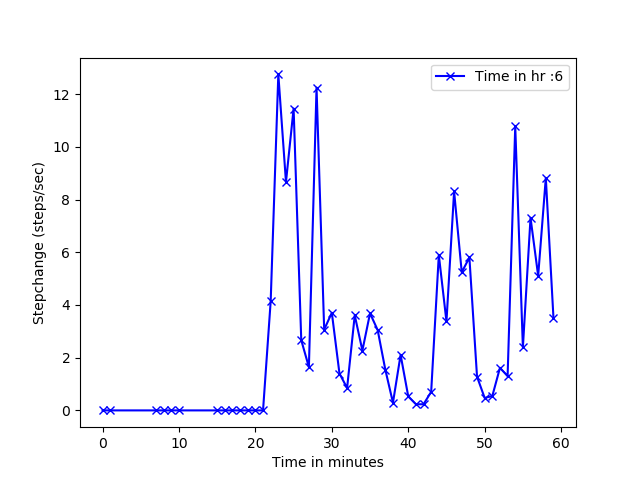

<IPython.core.display.Javascript object>


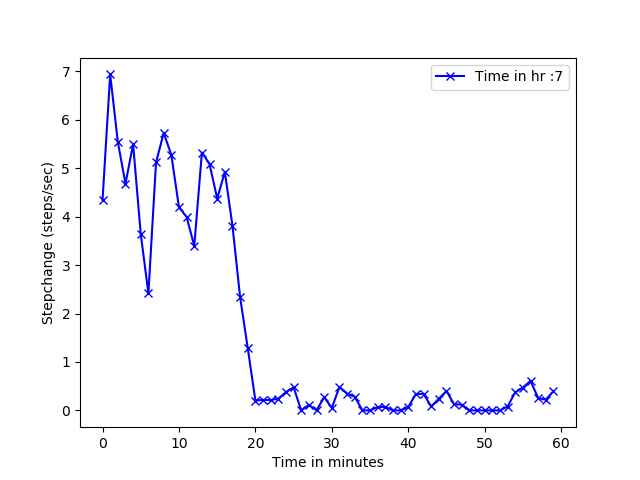

<IPython.core.display.Javascript object>


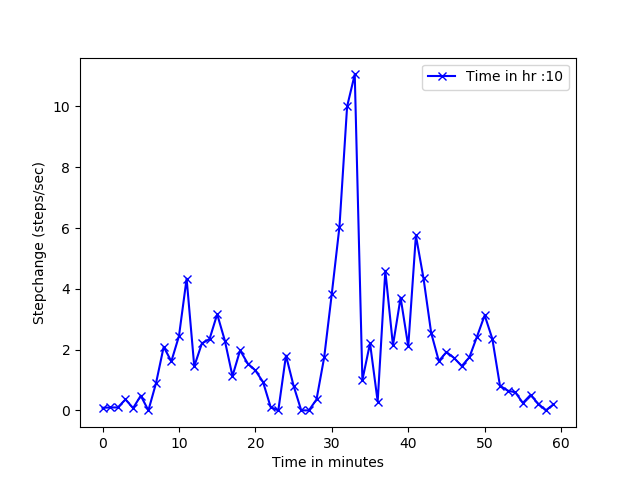

<IPython.core.display.Javascript object>


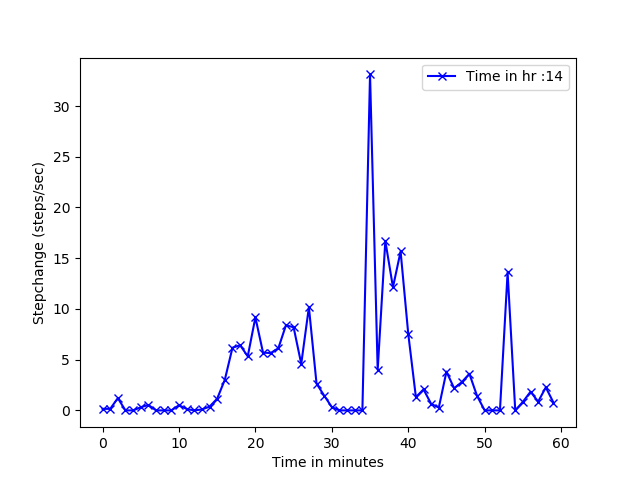

In [28]:

g = dfinal.groupby(dfinal.time.map(lambda x : x.hour))
for gpu in g:
    if gpu[0] in [6,7,10,14]:
        plt.figure()
        gp = gpu[1].groupby(by = dfinal.time.map(lambda x : x.minute))
        
        stud = gp.steps_change.mean()
        lab = 'Time in hr :'+ str(gpu[0])
        plt.plot(stud,color = 'b',marker='x',label = lab)
        plt.xlabel('Time in minutes')
        plt.ylabel('Stepchange (steps/sec)')
        plt.legend()
        plt.show()

### INFERENCE:
#### 6 : 20 to 6 : 30 AM ( peak at 6 : 23 AM)
####                         10: 30 to 10 : 40 AM( peak at 10 : 35 AM)
####                         14 : 30 to 14 : 40 PM ( peak at 14 : 38 PM)
                 

### III

### histogram plot for the frequency of students at 6 AM - 7AM, 10 AM to 11 AM, 13 AM to 14 AM

<IPython.core.display.Javascript object>


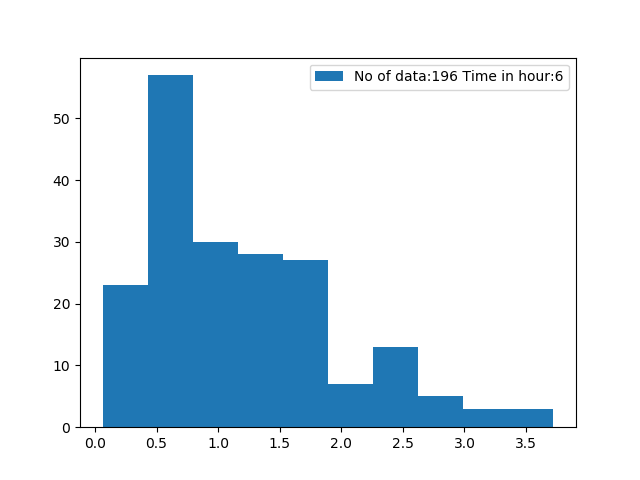

3.7222222222222223


<IPython.core.display.Javascript object>


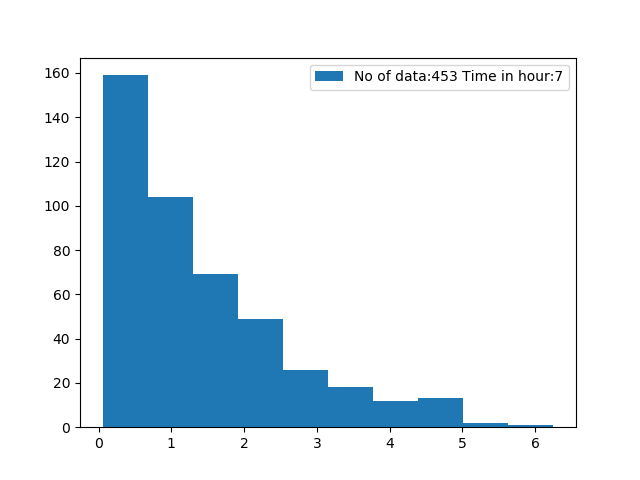

6.25


<IPython.core.display.Javascript object>


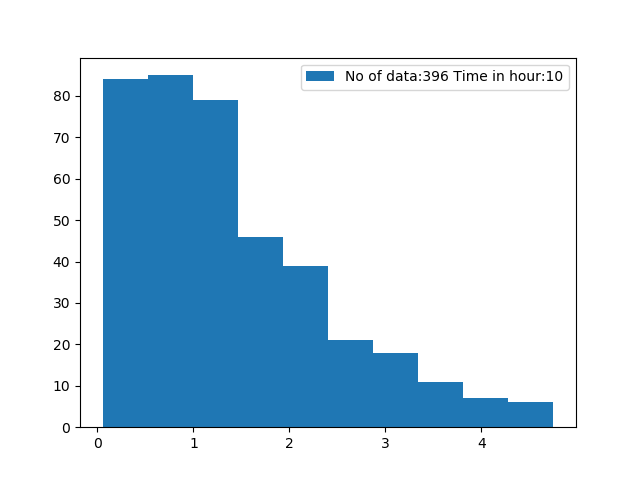

4.75


<IPython.core.display.Javascript object>


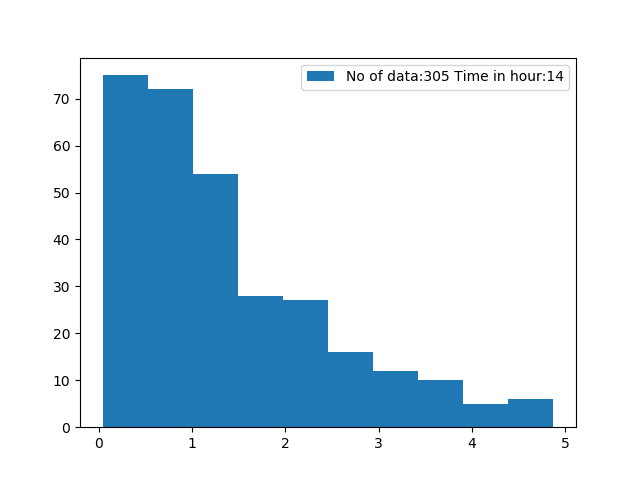

4.875


In [62]:
import numpy as np
grp = dfinal.groupby(by=[dfinal.time.map(lambda x : x.hour)])

for group in grp:
        if group[0] in [6,7,10,14]:
            mx = group[1].steps_change.max()
            if not mx ==0 and not math.isnan(mx): 
                #ax1 = fig.add_subplot(4,6,i)
                plt.figure()
                mn = group[1].steps_change.min()
                v = (mx - mn)/5
                bins = np.arange(mn,mx,v) #[0,10,20,30,40,50,60,70,80,90,100]
                #group_names = ['0','10','20','30','40','50','60']
                #print(list(group))
                lis=list(group[1].steps_change)
                lis=[x for x in lis if x!=0.0]
                #print(lis)
                group_names='No of data:'+str(len(lis))+' Time in hour:'+str(group[0])
                plt.hist(lis, bins=10, label = group_names)
                plt.legend()
                #plt.show()
                #df['categories'] = pd.cut(dat['step_change'], bins, labels=group_names)
                #print(group)
                print(mx)
                i+=1
#plt.tight_layout()

### histogram plot student wise i.e. number of students vs total number of steps covered

[0.0, 1.5277777777777777, 27.802450980392155, 12.581680898165716, 8.030403828197946, 0.0, 6.439950980392156, 6.252614379084967, 2.572598039215686, 0.0, 7.281209150326797, 13.050071695344805, 22.720996732026144, 22.49918300653595, 0.8492647058823529, 0.5614035087719298, 1.8263888888888888, 1.8428030303030305, 17.664687013616774, 4.705882352941177, 0.0, 0.0, 3.4875, 19.550669536107126, 8.158637211103347, 3.3125, 3.079044117647059, 7.483251633986928, 15.52124183006536, 11.440277777777776, 0.0, 0.0, 0.0]
[709482 709616 501890 402371 709673 500901 702365 402924 709753 709455
 709668 402799 501906 514270 709485 514590 514784 402823 702660 709880
 402920 504969 509365 514786 709675 709721 508343 709010 702364 709731
 702685 510519 709716]


<IPython.core.display.Javascript object>


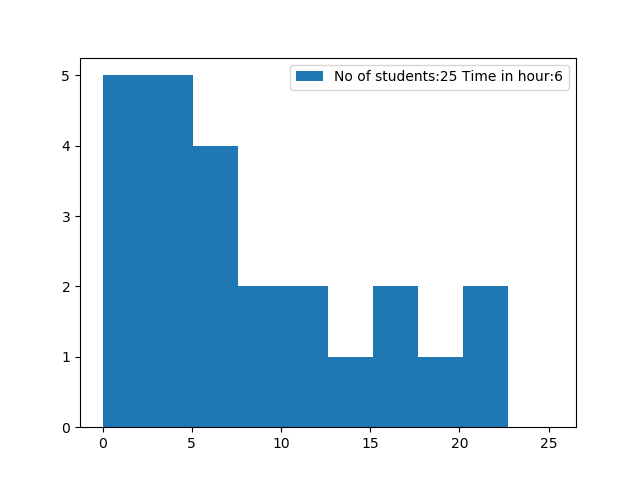

[0.4375, 101.54183006535946, 3.6522058823529413, 9.286764705882353, 2.5625, 11.131944444444445, 0.0, 1.1470588235294117, 3.766911764705882, 0.5333333333333333, 21.166666666666668, 2.611111111111111, 0.0, 0.5625, 2.8055555555555554, 0.875, 15.40171568627451, 18.479166666666664, 0.0, 14.73611111111111, 7.588071895424837, 3.9652777777777777, 0.0, 36.99125816993464, 7.736764705882353, 0.71875, 6.100235661640543, 13.341750362738441, 0.9041666666666667, 2.853860791008678, 0.0, 0.6707395498392282, 1.9444444444444444, 2.7930555555555556, 44.436659287370865, 4.645424836601308, 14.061164393293549, 17.184272875816994, 1.2777777777777777, 7.472222222222222, 69.37638888888888, 0.4375, 5.958326792255364, 42.63447712418301, 1.0763888888888888, 0.201219512195122, 1.3888888888888888, 13.955931372549019, 18.728156565656565, 10.109722222222222, 18.942083333333333, 0.0, 0.9375, 29.973841354723707, 39.16879084967321, 7.487737127371274, 4.986111111111111, 0.0, 0.0, 0.0]
[709485 509365 709675 709731 402371 5

<IPython.core.display.Javascript object>


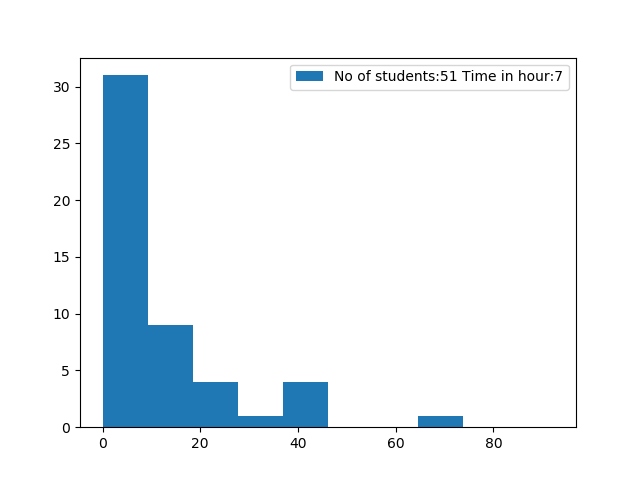

[30.742543077837198, 0.0, 0.0, 0.0, 0.0, 28.345067049808428, 9.67361111111111, 0.0, 152.51797385620915, 0.0, 0.0, 0.0, 28.399509803921568, 9.625, 72.31985294117646, 20.643954248366015, 3.6580882352941178, 0.4666666666666667, 71.87140522875816, 0.0, 6.763888888888889, 32.58311938167252, 5.272058823529411, 38.82165032679738, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 4.279166666666667, 0.0, 9.046160130718956, 1.8375, 3.9166666666666665, 6.21111111111111, 0.0, 14.034722222222223, 0.0, 0.0, 0.0, 0.625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[514786 709010 504969 702744 500901 709716 501906 702660 709669 506185
 402920 709675 709713 709899 709668 402793 709657 402799 513183 508343
 403037 702671 709866 702365 510586 702750 702685 510519 402371 402924
 501890 709721 709616 514980 709880 709731 514500 509943 709753 514270
 709916 702364 402866 515078 702436 403096 507660 402864 509365 709482
 709524 514784 402823 514590 709485 709695 510255 709455 702707 

<IPython.core.display.Javascript object>


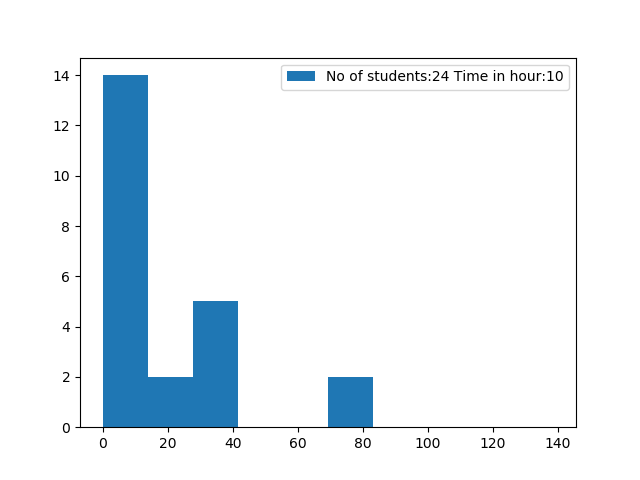

[27.253041199138615, 0.0, 1.5625, 21.646891107830186, 13.172588035214085, 2.7583333333333333, 0.0, 33.102052396969945, 66.1062351543943, 2.6875, 0.0, 26.550694444444446, 13.429656862745098, 39.46544736581502, 21.94654447642108, 21.656944444444445, 1.9522058823529411, 0.0, 0.0, 5.610416666666667, 12.890114379084967, 0.0, 0.0, 5.40204248366013, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9930555555555556, 10.593741901949349, 0.0, 0.0, 27.934722222222224, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 49.89810606060606, 0.0, 11.604166666666668, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.722222222222222]
[702671 702365 514590 403037 702744 402799 402793 709010 513183 709482
 702436 514786 709695 709866 709716 709899 709524 709675 702660 709616
 402866 501890 507660 709753 510255 709669 510519 501906 709721 702685
 509943 709657 504969 702364 709731 702750 514980 709713 709485 514784
 403096 402920 402924 500901 506185 509365 709668 514270 709916 508343
 709477 514500 502123 510586 402

<IPython.core.display.Javascript object>


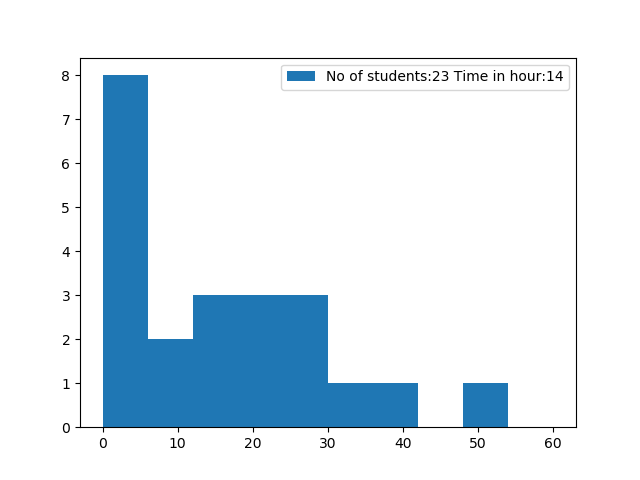

In [85]:
import numpy as np
grp = dfinal.groupby(by=[dfinal.time.map(lambda x : x.hour)])

for grup in grp:
        if grup[0] in [6,7,10,14]:
            ar = []
            ar = grup[1].nid.unique()
            sums = []

            for o in range(len(ar)):
                stu = grup[1].loc[grup[1]['nid'] == ar[o]]
                sums.append(stu.steps_change.sum())
            print(sums)
            print(ar)
            mx = max(sums)
            if not mx ==0 and not math.isnan(mx): 
                #ax1 = fig.add_subplot(4,6,i)
                plt.figure()
                mn = min(sums)
                v = (mx - mn)/11
                bins = np.arange(mn,mx,v) #[0,10,20,30,40,50,60,70,80,90,100]
                #group_names = ['0','10','20','30','40','50','60']
                #print(list(group))
                lis=sums
                lis=[x for x in lis if x!=0.0]
                #print(lis)
                group_names='No of students:'+str(len(lis))+' Time in hour:'+str(grup[0])
                plt.hist(lis, bins=bins, label = group_names)
                plt.legend()
                #plt.show()
                #df['categories'] = pd.cut(dat['step_change'], bins, labels=group_names)
                #print(group)
                #print(mx)
                i+=1
#plt.tight_layout()

In [80]:
max(sums)

66.1062351543943

In [76]:
ar

array([702671, 702365, 514590, 403037, 702744, 402799, 402793, 709010,
       513183, 709482, 702436, 514786, 709695, 709866, 709716, 709899,
       709524, 709675, 702660, 709616, 402866, 501890, 507660, 709753,
       510255, 709669, 510519, 501906, 709721, 702685, 509943, 709657,
       504969, 702364, 709731, 702750, 514980, 709713, 709485, 514784,
       403096, 402920, 402924, 500901, 506185, 509365, 709668, 514270,
       709916, 508343, 709477, 514500, 502123, 510586, 402371, 515078,
       709880, 702707, 507227, 507216])

### histogram plot of the frequency of students in tehrms of stepchange (instead of dsteps/dt)

[0.0, 26.0, 457.0, 229.0, 154.0, 0.0, 109.0, 118.0, 90.0, 0.0, 122.0, 267.0, 424.0, 374.0, 14.0, 16.0, 30.0, 149.0, 800.0, 77.0, 0.0, 0.0, 57.0, 549.0, 362.0, 55.0, 59.0, 126.0, 342.0, 185.0, 0.0, 0.0, 0.0]
[709482 709616 501890 402371 709673 500901 702365 402924 709753 709455
 709668 402799 501906 514270 709485 514590 514784 402823 702660 709880
 402920 504969 509365 514786 709675 709721 508343 709010 702364 709731
 702685 510519 709716]


<IPython.core.display.Javascript object>


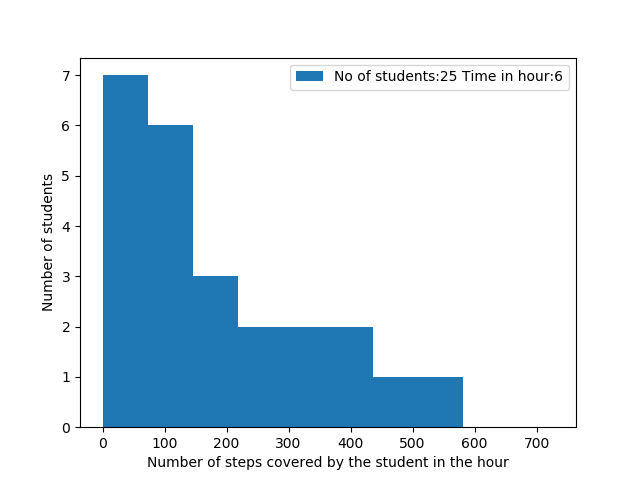

[7.0, 1804.0, 57.0, 164.0, 41.0, 180.0, 0.0, 23.0, 76.0, 8.0, 397.0, 43.0, 0.0, 9.0, 45.0, 14.0, 250.0, 308.0, 0.0, 246.0, 122.0, 65.0, 0.0, 602.0, 131.0, 16.0, 182.0, 399.0, 14.0, 251.0, 0.0, 31.0, 32.0, 45.0, 758.0, 76.0, 407.0, 398.0, 21.0, 134.0, 1192.0, 7.0, 244.0, 703.0, 18.0, 33.0, 23.0, 282.0, 428.0, 162.0, 388.0, 0.0, 16.0, 581.0, 662.0, 141.0, 110.0, 0.0, 0.0, 0.0]
[709485 509365 709675 709731 402371 514786 709880 709721 501890 500901
 709668 403037 514590 508343 709010 702660 709716 514270 402924 702707
 702365 402799 702685 702364 510519 501906 509943 709524 507227 504969
 402823 709616 402864 402866 709669 709753 514500 709713 515078 510586
 513183 507660 510255 402793 506185 709657 702744 514980 709695 403096
 709899 402920 709916 709866 702671 702436 709673 709455 709482 514784]


<IPython.core.display.Javascript object>


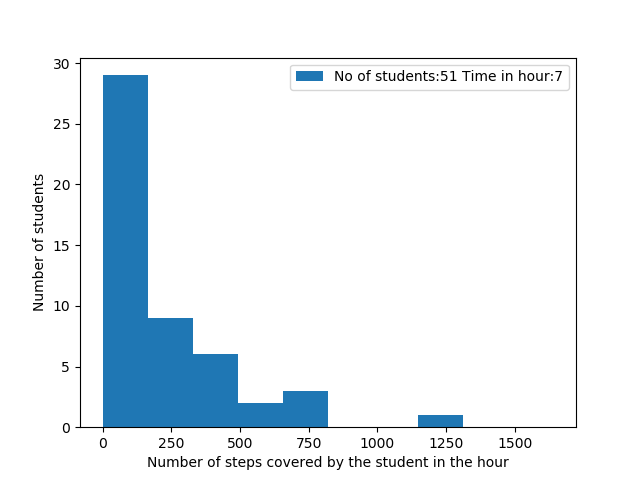

[499.0, 0.0, 0.0, 0.0, 0.0, 492.0, 157.0, 0.0, 2550.0, 0.0, 0.0, 0.0, 487.0, 156.0, 1228.0, 335.0, 61.0, 7.0, 1189.0, 0.0, 114.0, 559.0, 87.0, 633.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 66.0, 0.0, 151.0, 28.0, 67.0, 104.0, 0.0, 250.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[514786 709010 504969 702744 500901 709716 501906 702660 709669 506185
 402920 709675 709713 709899 709668 402793 709657 402799 513183 508343
 403037 702671 709866 702365 510586 702750 702685 510519 402371 402924
 501890 709721 709616 514980 709880 709731 514500 509943 709753 514270
 709916 702364 402866 515078 702436 403096 507660 402864 509365 709482
 709524 514784 402823 514590 709485 709695 510255 709455 702707 507227]


<IPython.core.display.Javascript object>


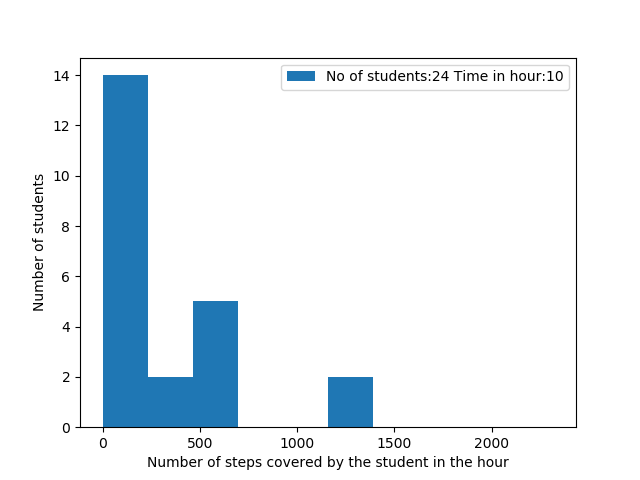

[639.0, 0.0, 25.0, 402.0, 344.0, 43.0, 0.0, 740.0, 1516.0, 47.0, 0.0, 485.0, 219.0, 834.0, 816.0, 442.0, 45.0, 0.0, 0.0, 96.0, 208.0, 0.0, 0.0, 87.0, 0.0, 0.0, 0.0, 0.0, 0.0, 17.0, 223.0, 0.0, 0.0, 452.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 892.0, 0.0, 195.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 82.0]
[702671 702365 514590 403037 702744 402799 402793 709010 513183 709482
 702436 514786 709695 709866 709716 709899 709524 709675 702660 709616
 402866 501890 507660 709753 510255 709669 510519 501906 709721 702685
 509943 709657 504969 702364 709731 702750 514980 709713 709485 514784
 403096 402920 402924 500901 506185 509365 709668 514270 709916 508343
 709477 514500 502123 510586 402371 515078 709880 702707 507227 507216]


<IPython.core.display.Javascript object>


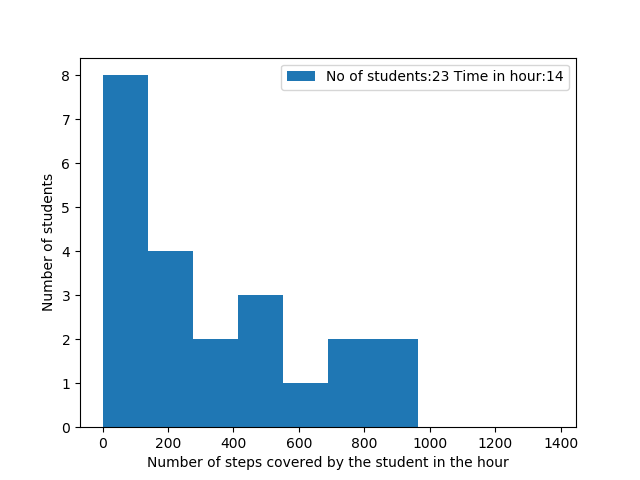

In [24]:
dfinal = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_accumulated.csv') 
import math
import numpy as np
grp = dfinal.groupby(dfinal['sgt'])
datetime = pd.to_datetime(dfinal['sgt'])
times = datetime.dt.time
dfinal['time']= times

grp = dfinal.groupby(by=[dfinal.time.map(lambda x : x.hour)])

for grup in grp:
        if grup[0] in [6,7,10,14]:
            ar = []
            ar = grup[1].nid.unique()
            sums = []

            for o in range(len(ar)):
                stu = grup[1].loc[grup[1]['nid'] == ar[o]]
                sums.append(stu.steps_change.sum())
            print(sums)
            print(ar)
            mx = max(sums)
            if not mx ==0 and not math.isnan(mx): 
                #ax1 = fig.add_subplot(4,6,i)
                plt.figure()
                mn = min(sums)
                v = (mx - mn)/11
                bins = np.arange(mn,mx,v) #[0,10,20,30,40,50,60,70,80,90,100]
                #group_names = ['0','10','20','30','40','50','60']
                #print(list(group))
                lis=sums
                lis=[x for x in lis if x!=0.0]
                #print(lis)
                group_names='No of students:'+str(len(lis))+' Time in hour:'+str(grup[0])
                plt.hist(lis, bins=bins, label = group_names)
                plt.legend()
                plt.xlabel('Number of steps covered by the student in the hour')
                plt.ylabel('Number of students')
                #plt.show()
                #df['categories'] = pd.cut(dat['step_change'], bins, labels=group_names)
                #print(group)
                #print(mx)
               
#plt.tight_layout()

### histogram info 

In [91]:
dfinal = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_accumulated.csv') 
import numpy as np
grp = dfinal.groupby(dfinal['sgt'])
datetime = pd.to_datetime(dfinal['sgt'])
times = datetime.dt.time
dfinal['time']= times

grp = dfinal.groupby(by=[dfinal.time.map(lambda x : x.hour)])

for grup in grp:
        if grup[0] in [6,7,10,14]:
            ar = []
            ar = grup[1].nid.unique()
            sums = []

            for o in range(len(ar)):
                stu = grup[1].loc[grup[1]['nid'] == ar[o]]
                sums.append(stu.steps_change.sum())
            #print(sums)
            #print(ar)
            mx = max(sums)
            if not mx ==0 and not math.isnan(mx): 
                #ax1 = fig.add_subplot(4,6,i)
                #plt.figure()
                mn = min(sums)
                v = (mx - mn)/11
                bins = np.arange(mn,mx,v) #[0,10,20,30,40,50,60,70,80,90,100]
                #group_names = ['0','10','20','30','40','50','60']
                #print(list(group))
                lis=sums
                lis=[x for x in lis if x!=0.0]
                #print(lis)
                group_names='No of students:'+str(len(lis))+' Time in hour:'+str(grup[0])
                #plt.hist(lis, bins=bins, label = group_names)
                #plt.legend()
                count, division = np.histogram(lis,bins = bins)
                print(count)
                print(division)
                #plt.show()
                #df['categories'] = pd.cut(dat['step_change'], bins, labels=group_names)
                #print(group)
                #print(mx)
                i+=1
#plt.tight_layout()

[7 6 3 2 2 2 1 1 0 0]
[  0.          72.72727273 145.45454545 218.18181818 290.90909091
 363.63636364 436.36363636 509.09090909 581.81818182 654.54545455
 727.27272727]
[29  9  6  2  3  0  0  1  0  0]
[   0.  164.  328.  492.  656.  820.  984. 1148. 1312. 1476. 1640.]
[14  2  5  0  0  2  0  0  0  0]
[   0.          231.81818182  463.63636364  695.45454545  927.27272727
 1159.09090909 1390.90909091 1622.72727273 1854.54545455 2086.36363636
 2318.18181818]
[8 4 2 3 1 2 2 0 0 0]
[   0.          137.81818182  275.63636364  413.45454545  551.27272727
  689.09090909  826.90909091  964.72727273 1102.54545455 1240.36363636
 1378.18181818]


In [16]:
# import pandas as pd
dfinal = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_accumulated.csv') 
import numpy as np
import math
grp = dfinal.groupby(dfinal['sgt'])
datetime = pd.to_datetime(dfinal['sgt'])
times = datetime.dt.time
dfinal['time']= times

grp = dfinal.groupby(by=[dfinal.time.map(lambda x : x.hour)])
i=0
for grup in grp:
        if grup[0] in [6,7,10,14]:
            ar = []
            ar = grup[1].nid.unique()
            sums = []

            for o in range(len(ar)):
                stu = grup[1].loc[grup[1]['nid'] == ar[o]]
                sums.append(stu.steps_change.sum())
            #print(sums)
            #print(ar)
            mx = max(sums)
            if not mx ==0 and not math.isnan(mx): 
                #ax1 = fig.add_subplot(4,6,i)
                mn = min(sums)
                v = (mx - mn)/11
                bins = np.arange(mn,mx,v) #[0,10,20,30,40,50,60,70,80,90,100]
                #group_names = ['0','10','20','30','40','50','60']
                #print(list(group))
                lis=sums
                lis=[x for x in lis if x!=0.0]
                #print(lis)
                group_names='No of students:'+str(len(lis))+' Time in hour:'+str(grup[0])
                count,division = np.histogram(lis,bins = bins)
                cutoff = division[1]
                #df['categories'] = pd.cut(dat['step_change'], bins, labels=group_names)
                #print(group)
                #print(mx)
            for i in range(len(bins)):    
                for x in range(len(sums)):
                    if i== len(bins)-1 and sums[x]>division[i]:
                        print(ar[x],i)
                        
                    elif i != len(bins)-1 and sums[x] <=division[i+1] and sums[x]>division[i]:
                        print(ar[x], i)
            print(grup[0])
            #i+=1
                    
#plt.tight_layout()                

709616 0
709485 0
514590 0
514784 0
509365 0
709721 0
508343 0
702365 1
402924 1
709753 1
709668 1
709880 1
709010 1
709673 2
402823 2
709731 2
402371 3
402799 3
709675 4
702364 4
501906 5
514270 5
501890 6
514786 7
702660 10
6
709485 0
709675 0
709731 0
402371 0
709721 0
501890 0
500901 0
403037 0
508343 0
709010 0
702660 0
702365 0
402799 0
510519 0
501906 0
507227 0
709616 0
402864 0
402866 0
709753 0
515078 0
510586 0
507660 0
506185 0
709657 0
702744 0
403096 0
709916 0
702436 0
709673 0
514786 1
709716 1
514270 1
702707 1
509943 1
504969 1
510255 1
514980 1
709668 2
709524 2
514500 2
709713 2
709695 2
709899 2
702364 3
709866 3
709669 4
402793 4
702671 4
513183 7
509365 10
7
501906 0
709899 0
709657 0
402799 0
403037 0
709866 0
709721 0
709616 0
709880 0
709731 0
514500 0
509943 0
515078 0
514590 0
402793 1
514270 1
514786 2
709716 2
709713 2
702671 2
702365 2
709668 5
513183 5
709669 10
10
514590 0
402799 0
709482 0
709524 0
709616 0
709753 0
702685 0
507216 0
709695 1
402866 1


### Inference: 
those in the same bins can be grouped together and as considred as a group
this group can be verified with the correlation matrix results
### observation: 
no, the ones haivng high correlation coefficient does not seem to be having the same total step change every hour, but the trend is same, i.e. they have the same trend of stepchange  

In [95]:
bins

array([   0.        ,  137.81818182,  275.63636364,  413.45454545,
        551.27272727,  689.09090909,  826.90909091,  964.72727273,
       1102.54545455, 1240.36363636, 1378.18181818])

#### according to few experiments conducted with senSG device, it is noted that for 1m rise in altitude, 12 Pa drop occurs
#### implying for every floor increase there's approximately 30 Pa drop.
using this info, VDA is found in order to find time based Vertical displacement


In [1]:
import pandas as pd
dfin = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_Final.csv')
df_vda = dfin[dfin.press_change>1.7]
df_hda = dfin[dfin.press_change<1.7]

In [19]:
df_vda

,Unnamed: 0,Unnamed: 0.1,id,nid,sgt,rts,hum,light,mode,cmode,...,mac,lat,lon,acc,time,epoch_time,TIMESTAMP,press_change,steps_change,time_change
7,1307,206,180688583,709482,2016-05-24 05:54:25,2016-06-24 03:56:13,74.0,0,6,4,...,"MAC:002675aaa160 RSSI:-72,MAC:e08e3c008770 RSS...",1.315018,103.762918,128,05:54:25,1.464049e+09,1.464049e+09,2.066667,0.000000,15.0
11,1310,214,180688587,709482,2016-05-24 05:55:32,2016-06-24 03:56:16,73.5,0,6,4,...,"MAC:d0c28266f376 RSSI:-68,MAC:d0c28266f373 RSS...",1.314837,103.762335,81,05:55:32,1.464050e+09,1.464050e+09,2.187500,0.000000,16.0
77,1873,378,179320599,501890,2016-05-24 06:22:52,2016-06-24 12:28:04,68.0,0,2,2,...,"MAC:000b819b6285 RSSI:-61,MAC:e46f13f5589c RSS...",1.314877,103.762796,114,06:22:52,1.464051e+09,1.464051e+09,2.187500,1.812500,16.0
106,31,408,181188078,709616,2016-05-24 06:26:16,2016-06-24 05:44:55,73.0,0,6,1,...,"MAC:f81a673a837e RSSI:-57,MAC:7824af9482a8 RSS...",1.315601,103.761527,147,06:26:16,1.464051e+09,1.464051e+09,1.812500,0.000000,16.0
109,32,411,181188079,709616,2016-05-24 06:26:31,2016-06-24 05:44:55,73.0,0,6,1,...,"MAC:f81a673a837e RSSI:-52,MAC:002675c22d6c RSS...",1.315622,103.761522,147,06:26:31,1.464051e+09,1.464051e+09,2.200000,0.000000,15.0
144,5283,451,179138190,709673,2016-05-24 06:28:58,2016-06-24 07:44:30,65.0,0,3,2,...,"MAC:48ee0c6cbf04 RSSI:-74,MAC:002675cf5941 RSS...",1.315968,103.763827,147,06:28:58,1.464052e+09,1.464052e+09,1.750000,0.000000,16.0
301,5587,623,179540246,500901,2016-05-24 06:36:58,2016-06-24 12:59:00,71.5,0,6,1,...,"MAC:10feedc31e90 RSSI:-61,MAC:00026fcd7ac0 RSS...",1.315074,103.761984,57,06:36:58,1.464052e+09,1.464052e+09,1.933333,0.000000,15.0
373,61,708,181188108,709616,2016-05-24 06:39:57,2016-06-24 05:44:55,73.5,0,6,1,...,"MAC:7824af9482a8 RSSI:-66,MAC:f81a673a837e RSS...",1.315622,103.761522,147,06:39:57,1.464052e+09,1.464052e+09,1.764706,0.000000,17.0
376,1936,710,179320662,501890,2016-05-24 06:40:00,2016-06-24 12:28:10,70.0,0,1,1,...,"MAC:88f077bee506 RSSI:-46,MAC:88f077bee500 RSS...",1.315296,103.761690,44,06:40:00,1.464052e+09,1.464052e+09,2.555556,0.000000,18.0
385,1937,720,179320663,501890,2016-05-24 06:40:16,2016-06-24 12:28:10,70.0,0,1,1,...,"MAC:e8ba70537fc6 RSSI:-57,MAC:e8ba70537fc3 RSS...",1.315187,103.761818,87,06:40:16,1.464052e+09,1.464052e+09,2.875000,0.000000,16.0


<IPython.core.display.Javascript object>


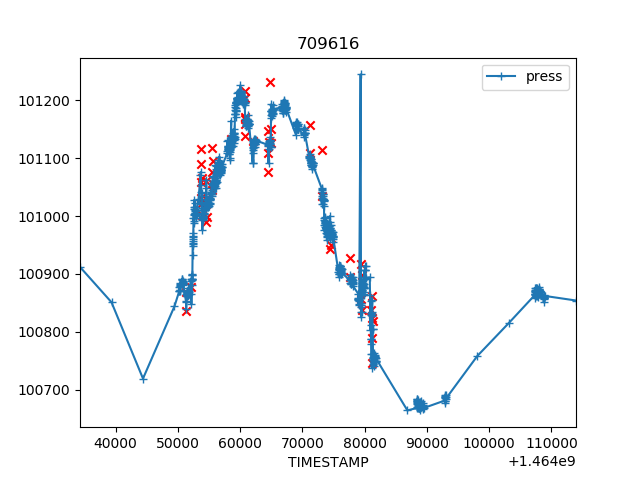

<IPython.core.display.Javascript object>


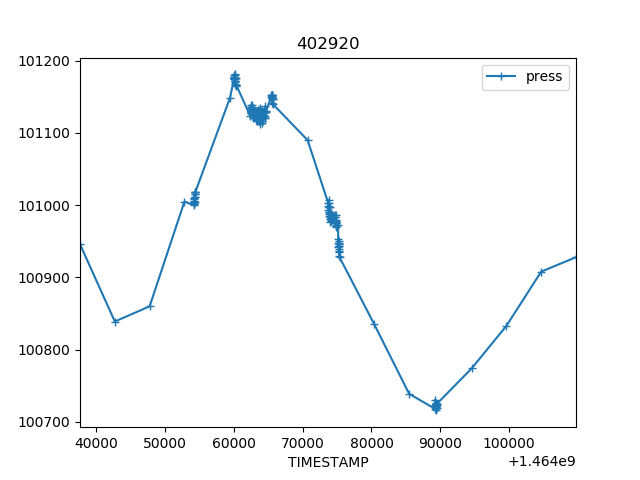

<IPython.core.display.Javascript object>


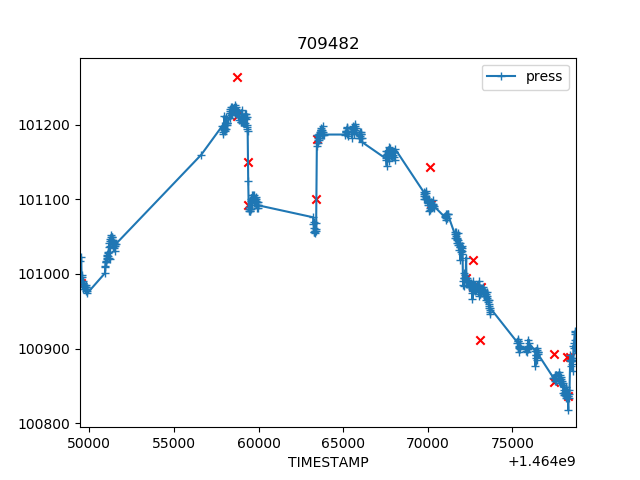

<IPython.core.display.Javascript object>


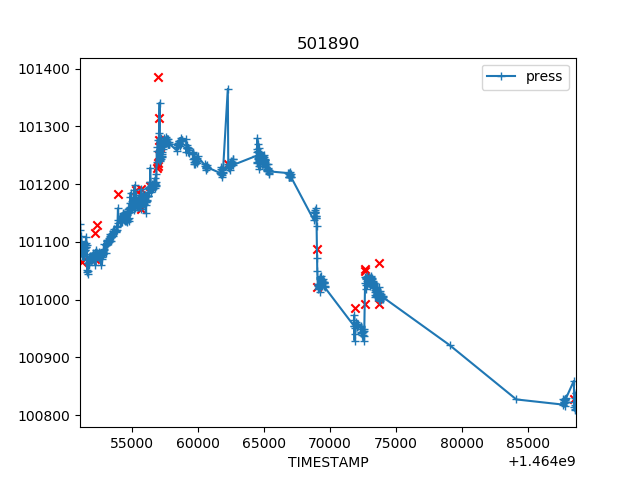

<IPython.core.display.Javascript object>


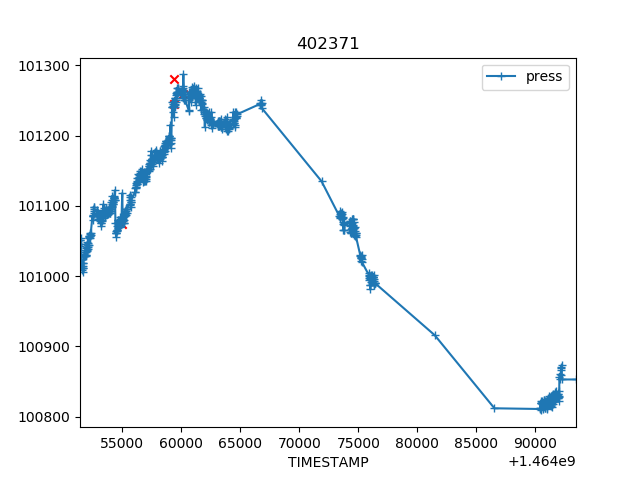

<IPython.core.display.Javascript object>


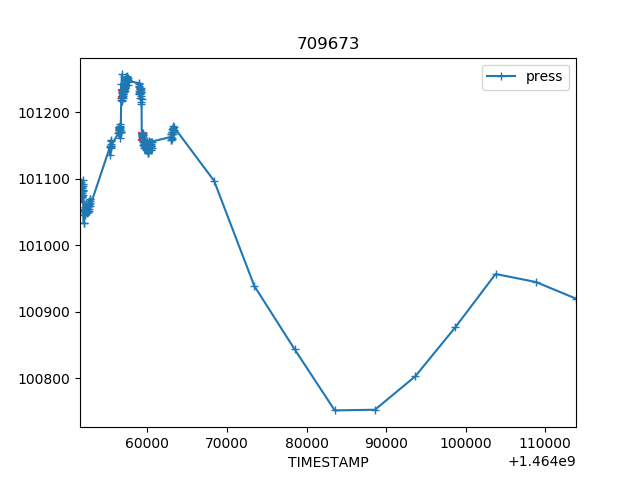

<IPython.core.display.Javascript object>


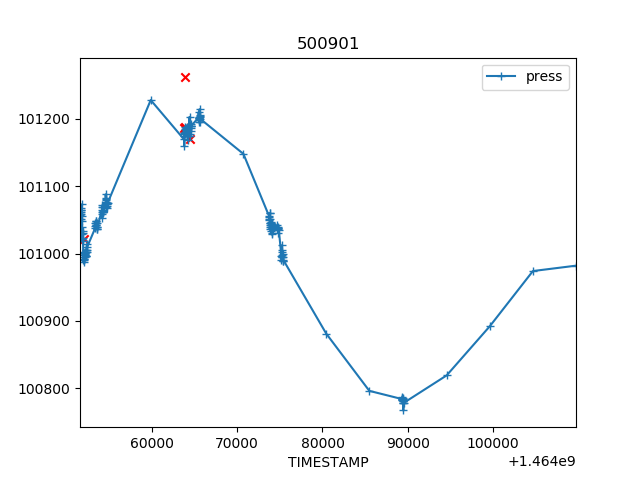

<IPython.core.display.Javascript object>


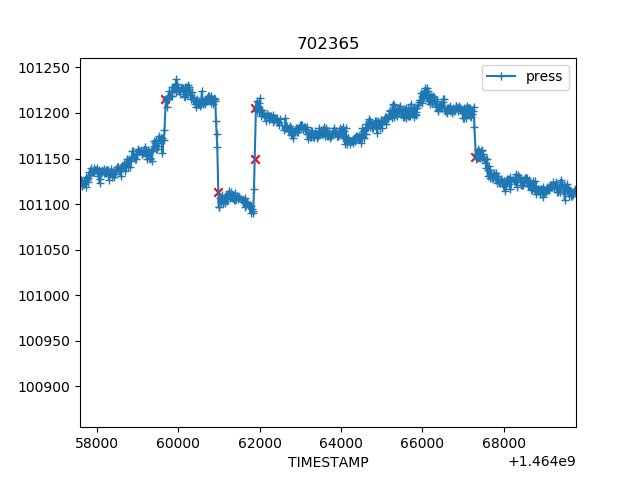

<IPython.core.display.Javascript object>


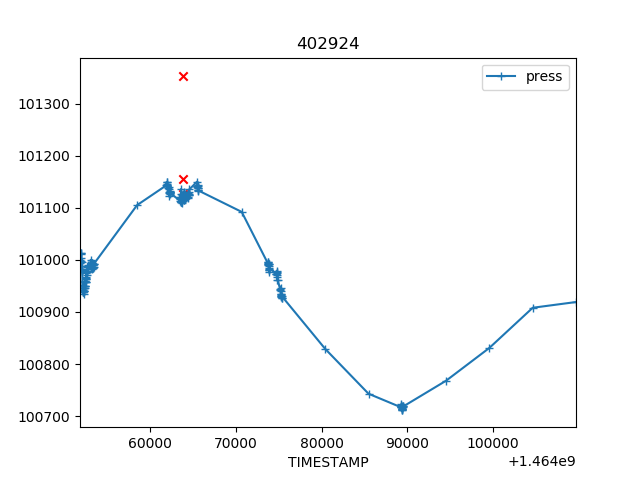

<IPython.core.display.Javascript object>


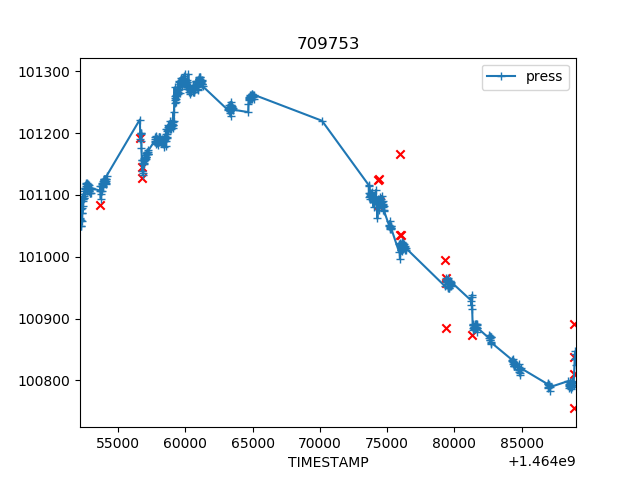

<IPython.core.display.Javascript object>


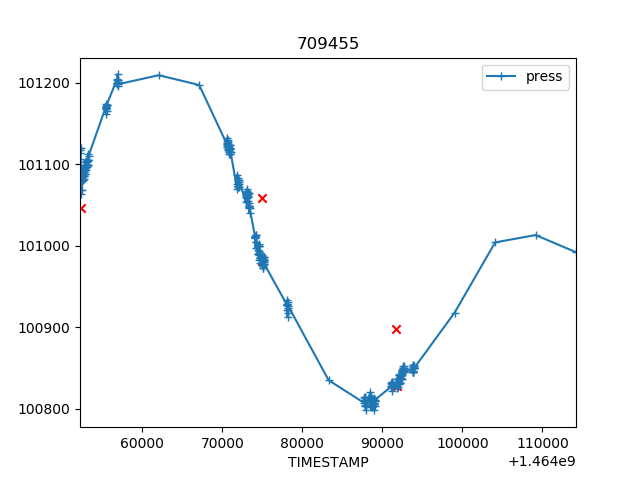

<IPython.core.display.Javascript object>


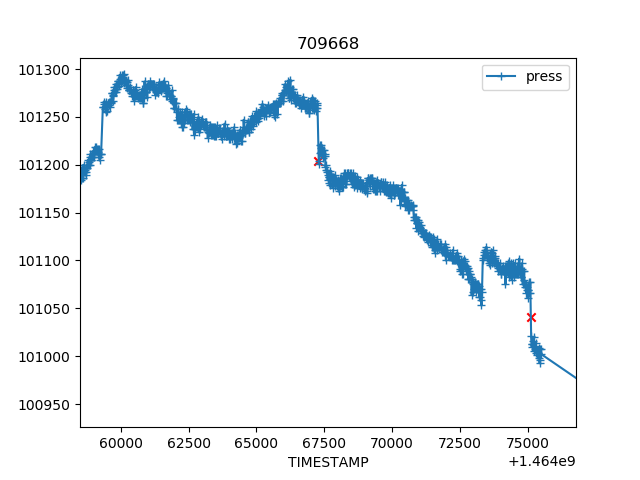

<IPython.core.display.Javascript object>


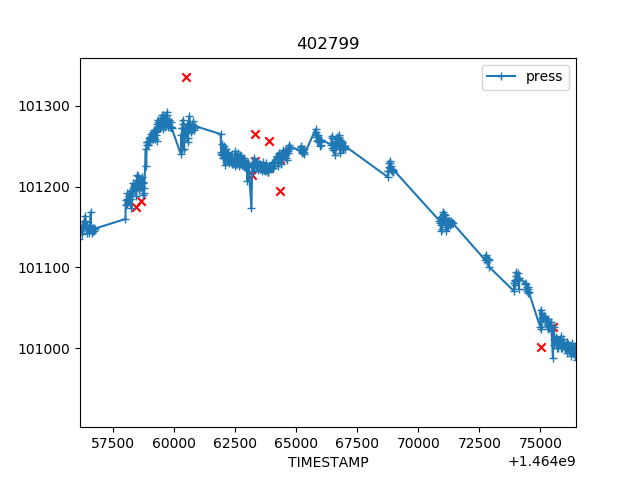

<IPython.core.display.Javascript object>


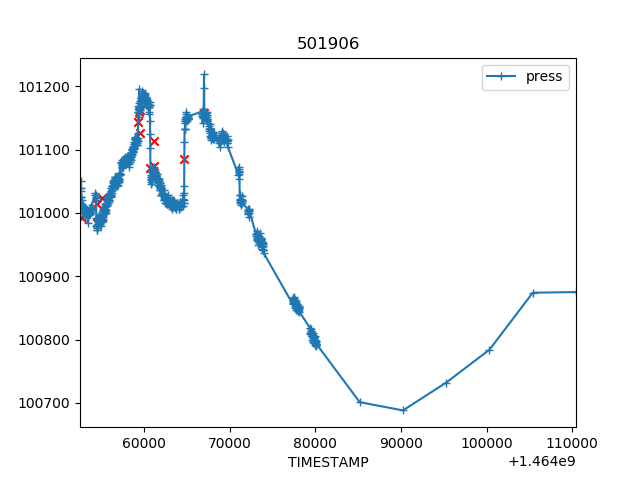

<IPython.core.display.Javascript object>


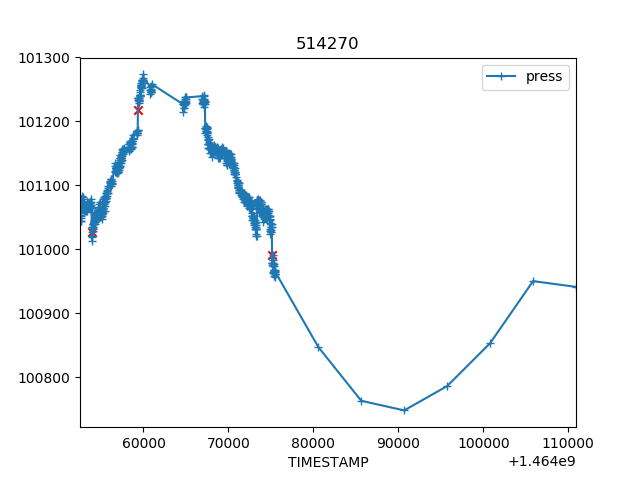

<IPython.core.display.Javascript object>


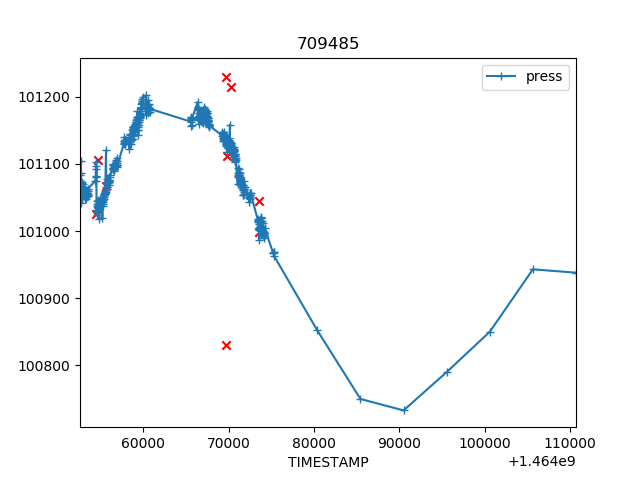

<IPython.core.display.Javascript object>


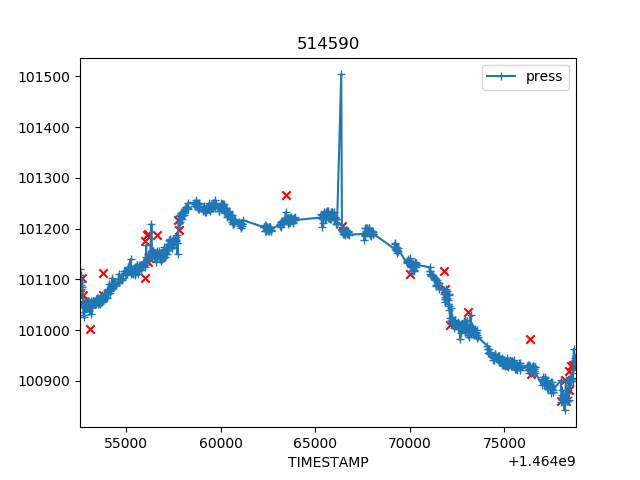

<IPython.core.display.Javascript object>


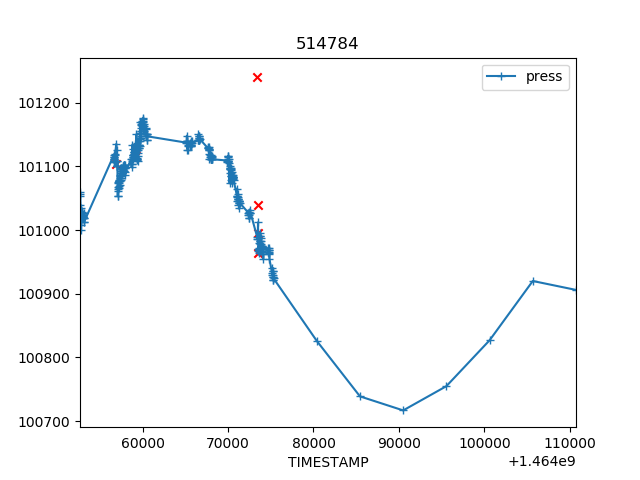

<IPython.core.display.Javascript object>


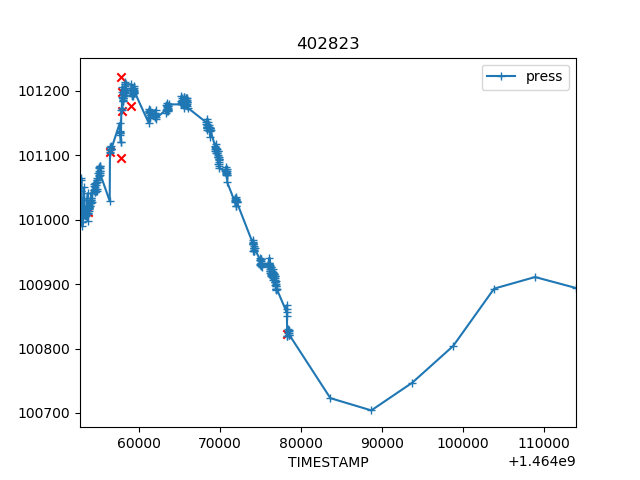

<IPython.core.display.Javascript object>


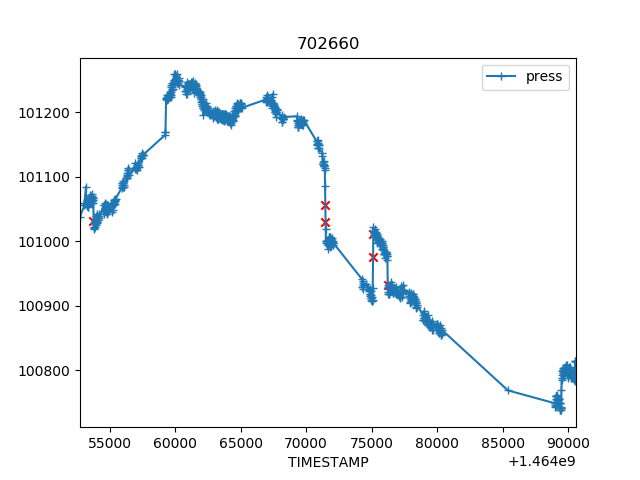

<IPython.core.display.Javascript object>


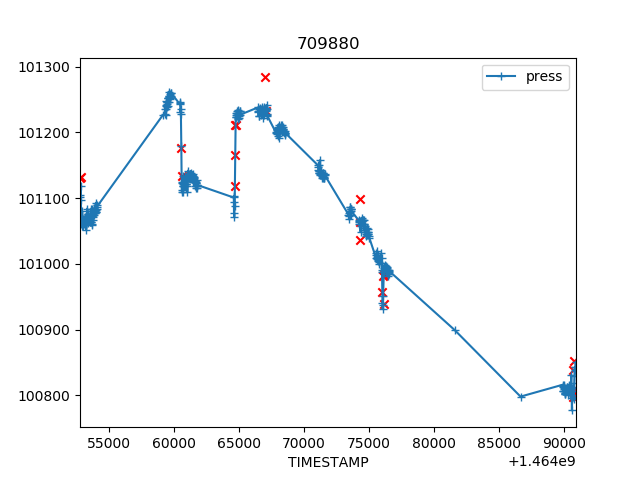

<IPython.core.display.Javascript object>


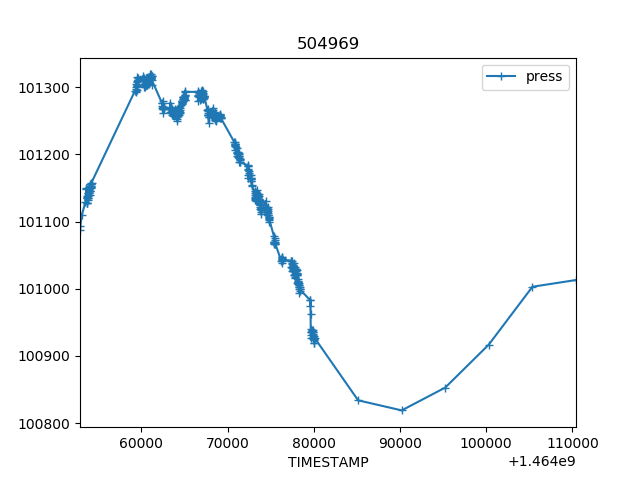

<IPython.core.display.Javascript object>


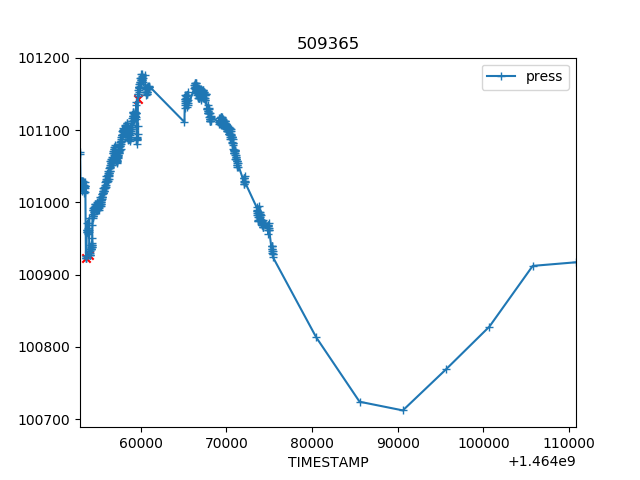

<IPython.core.display.Javascript object>


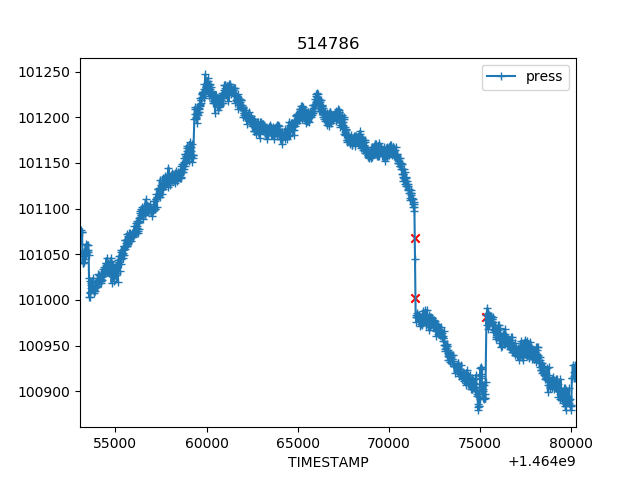

<IPython.core.display.Javascript object>


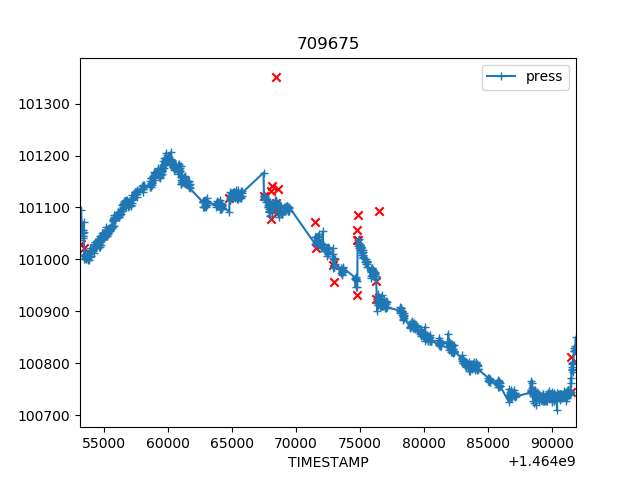

<IPython.core.display.Javascript object>


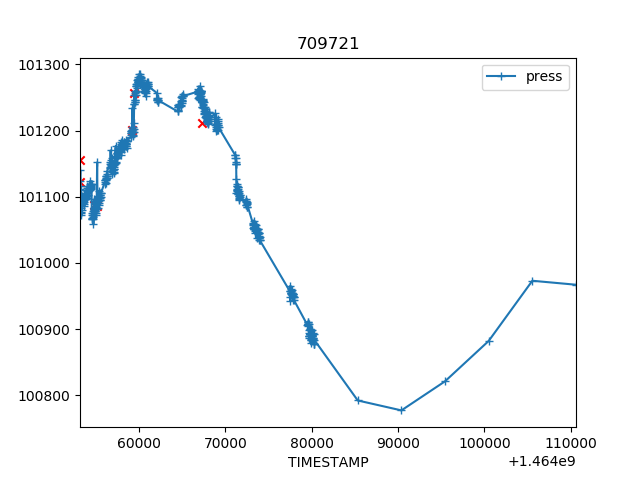

<IPython.core.display.Javascript object>


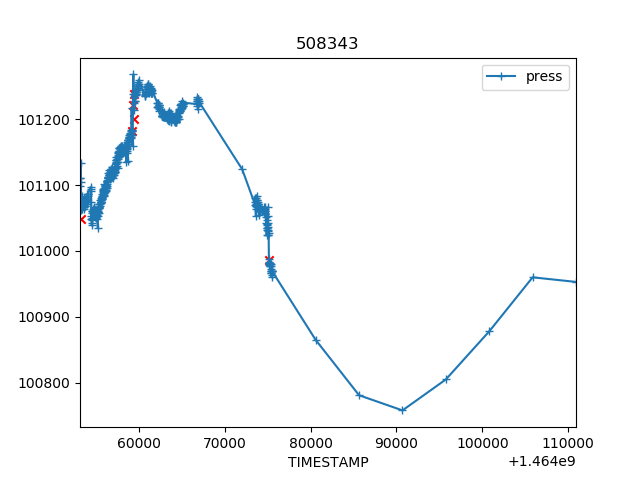

<IPython.core.display.Javascript object>


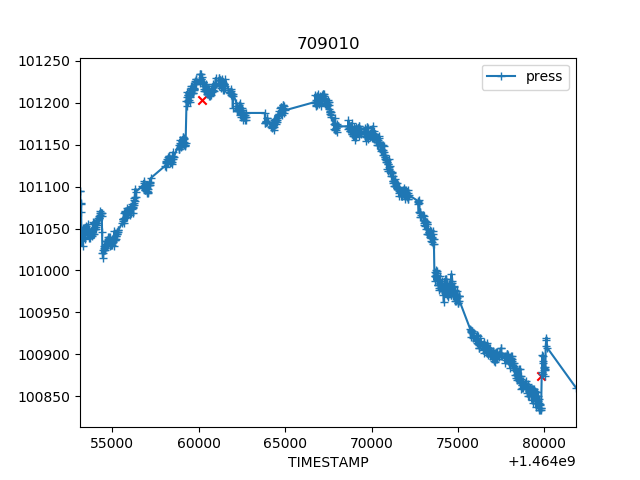

<IPython.core.display.Javascript object>


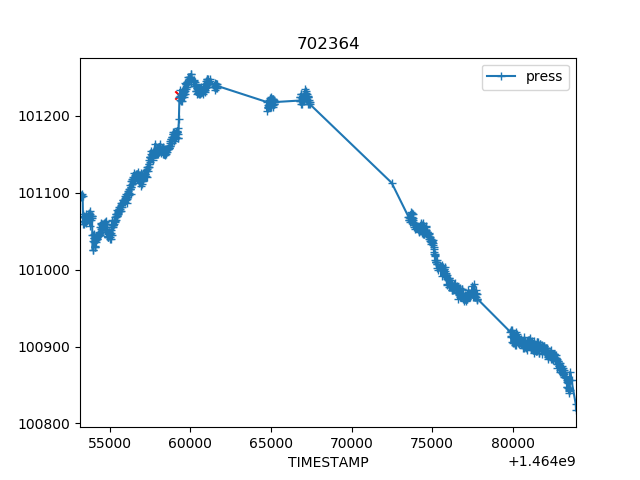

<IPython.core.display.Javascript object>


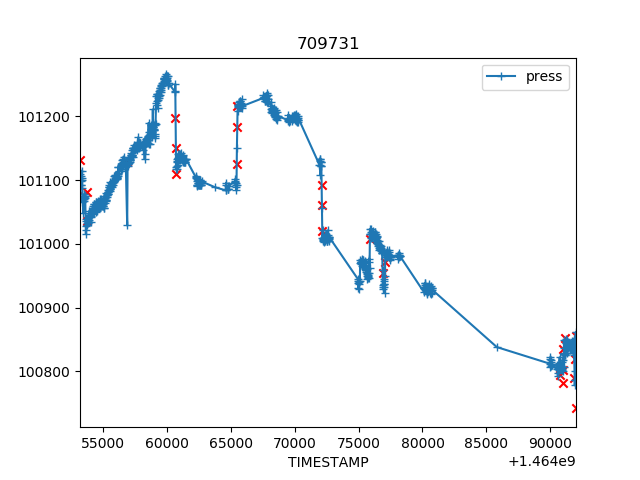

<IPython.core.display.Javascript object>


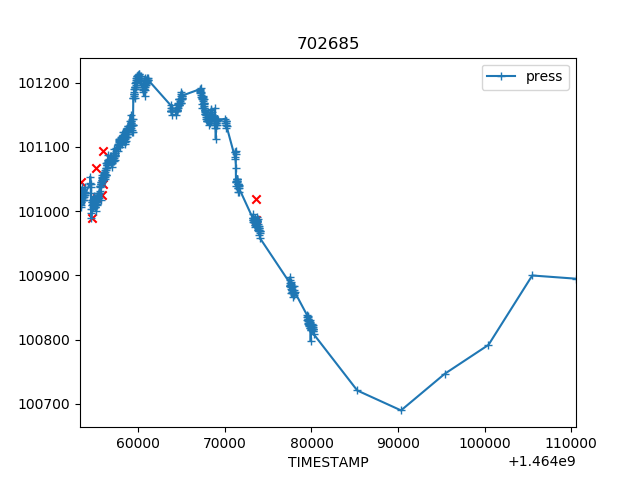

<IPython.core.display.Javascript object>


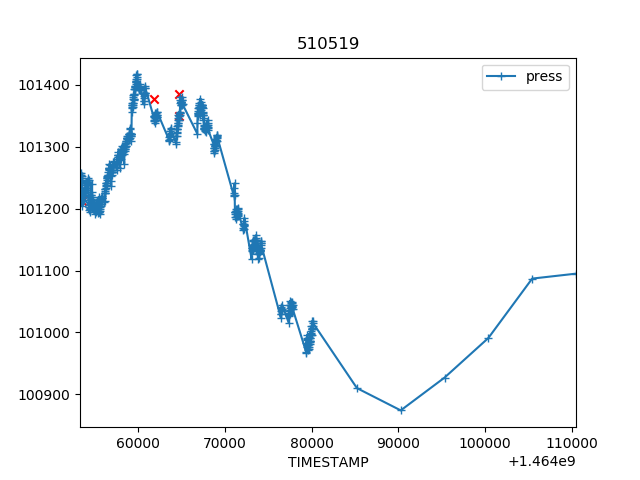

<IPython.core.display.Javascript object>


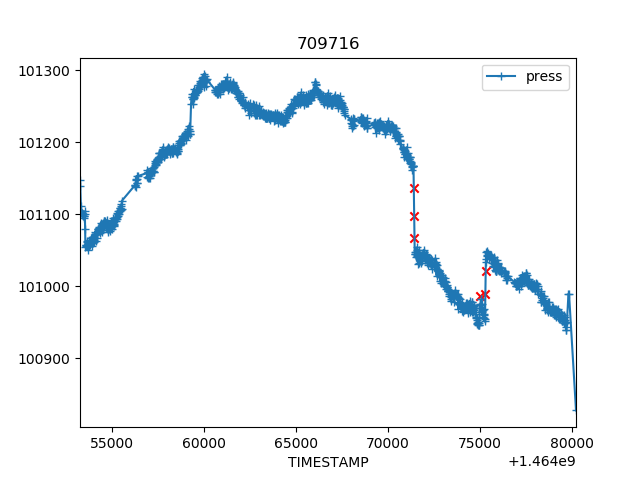

<IPython.core.display.Javascript object>


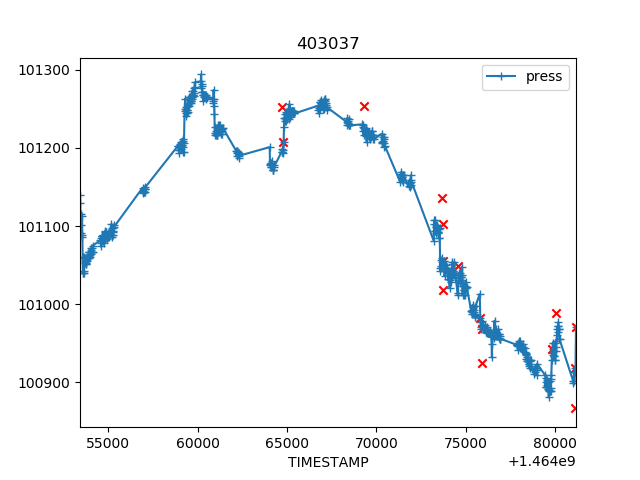

<IPython.core.display.Javascript object>


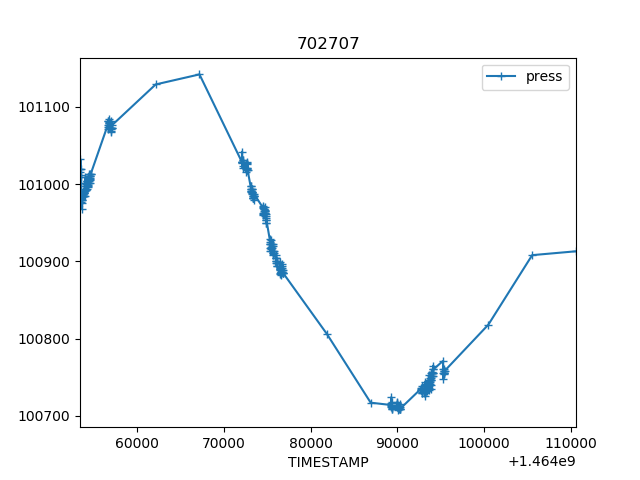

<IPython.core.display.Javascript object>


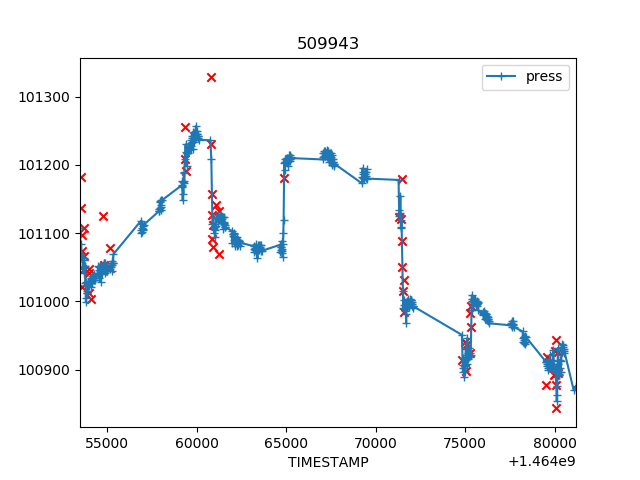

<IPython.core.display.Javascript object>


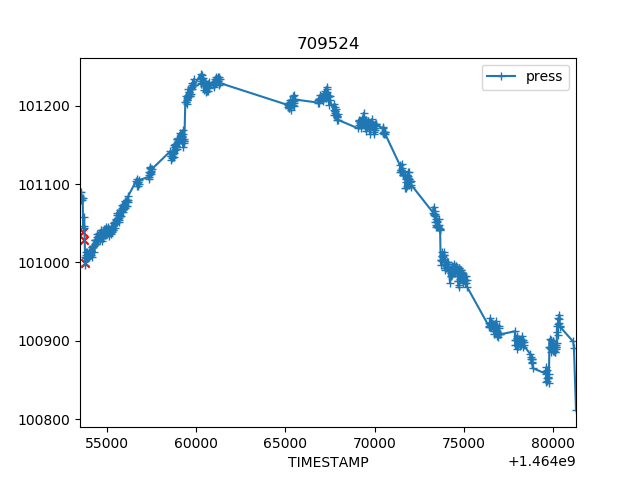

<IPython.core.display.Javascript object>


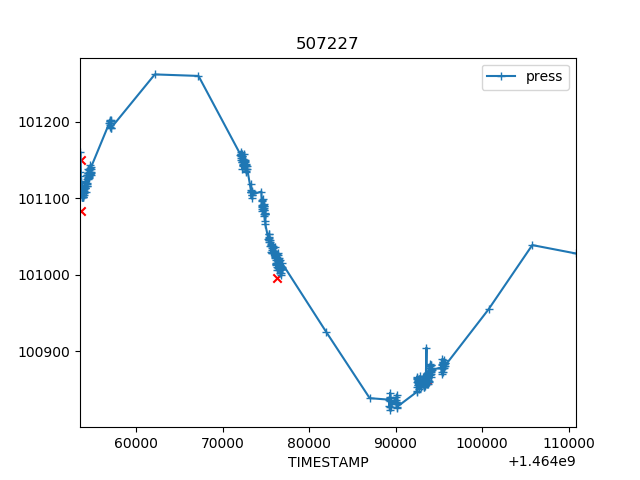

<IPython.core.display.Javascript object>


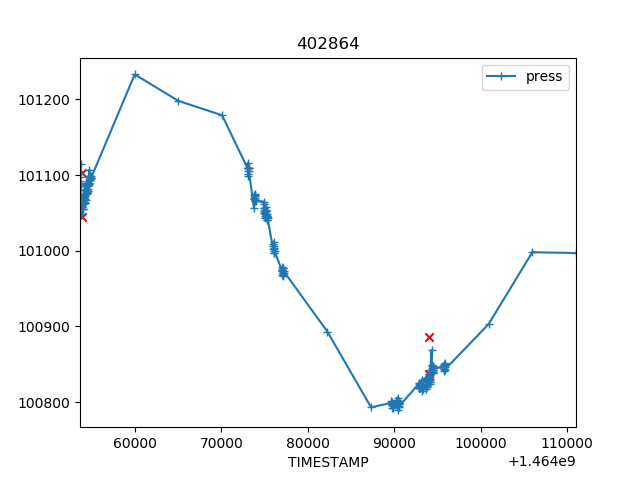

<IPython.core.display.Javascript object>


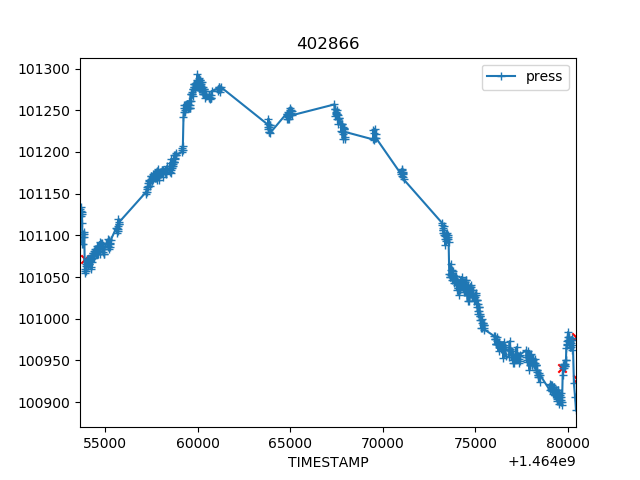

<IPython.core.display.Javascript object>


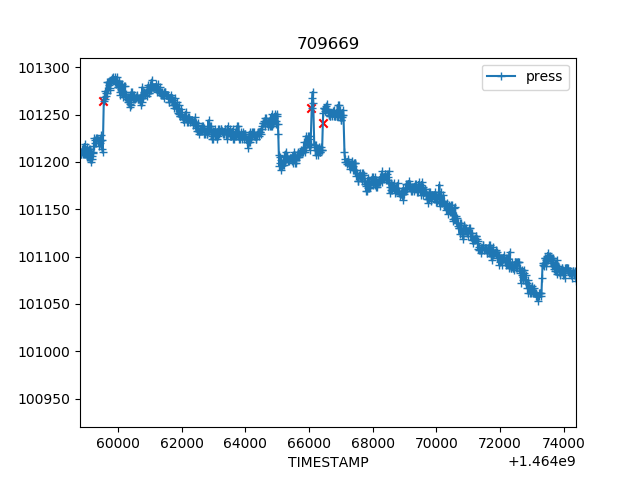

<IPython.core.display.Javascript object>


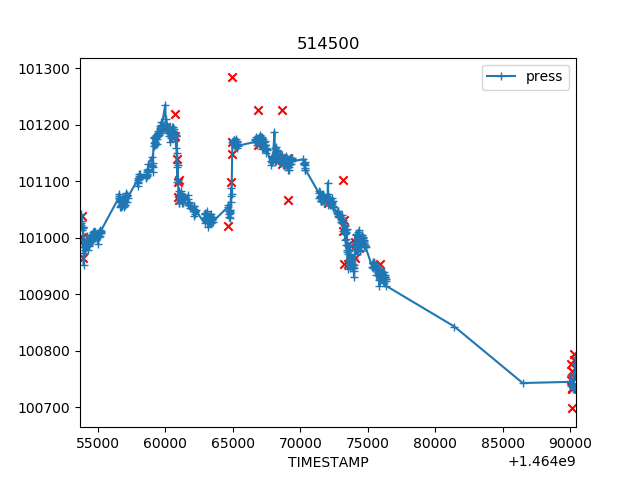

<IPython.core.display.Javascript object>


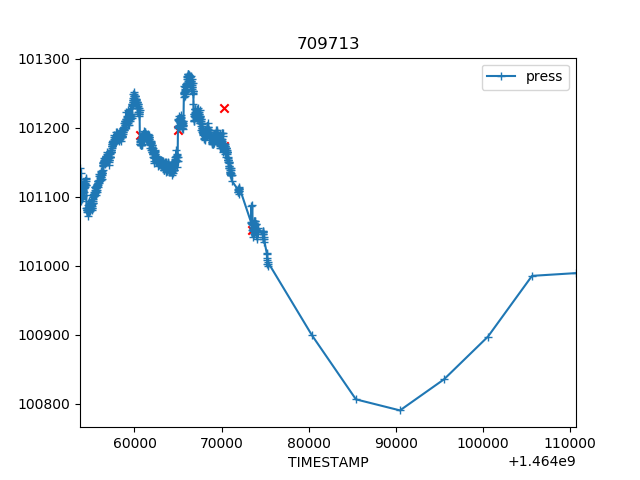

<IPython.core.display.Javascript object>


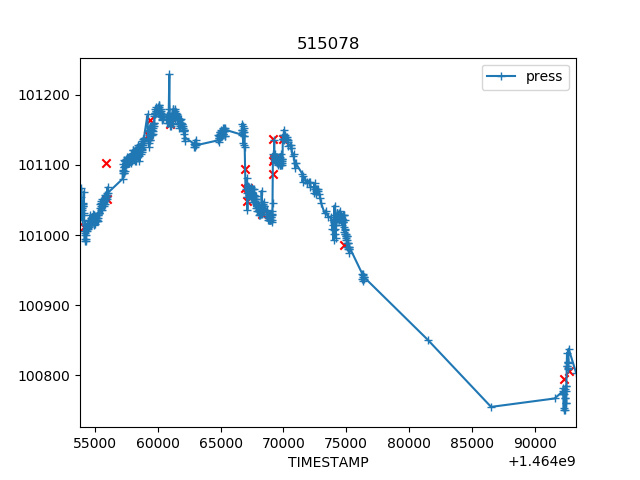

<IPython.core.display.Javascript object>


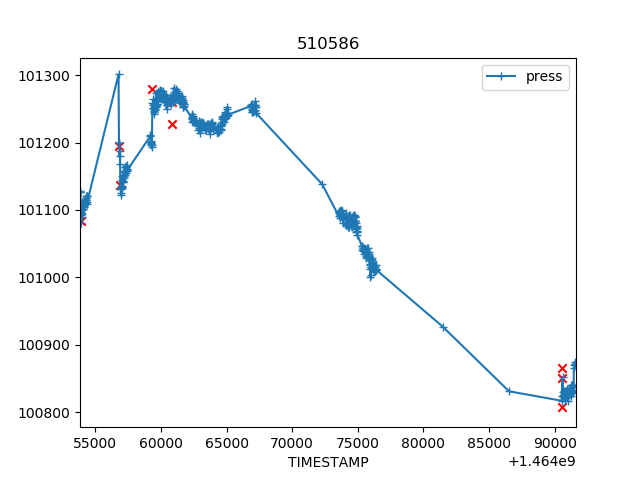

<IPython.core.display.Javascript object>


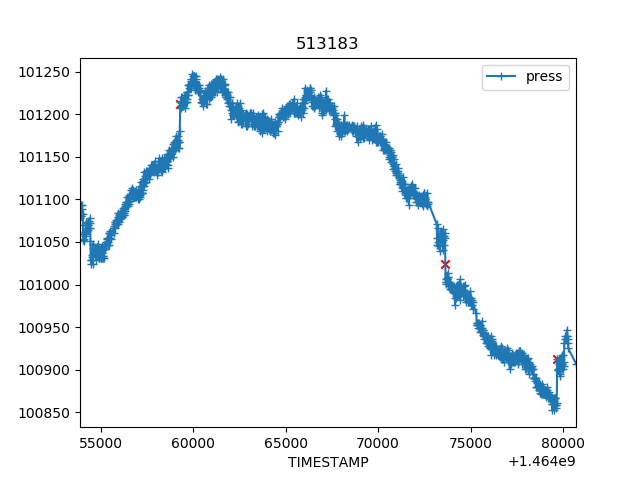

<IPython.core.display.Javascript object>


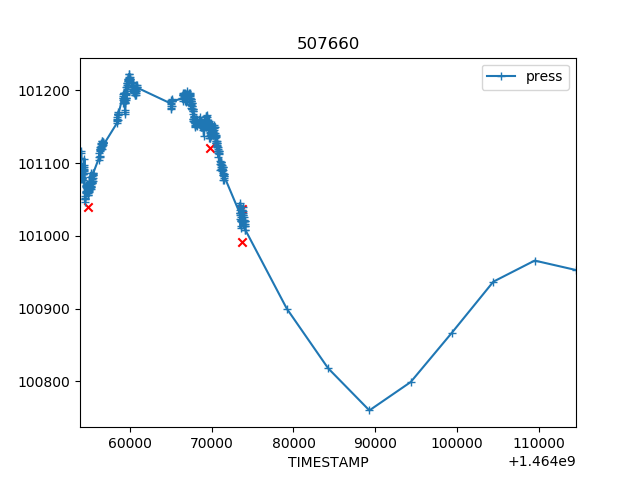

<IPython.core.display.Javascript object>


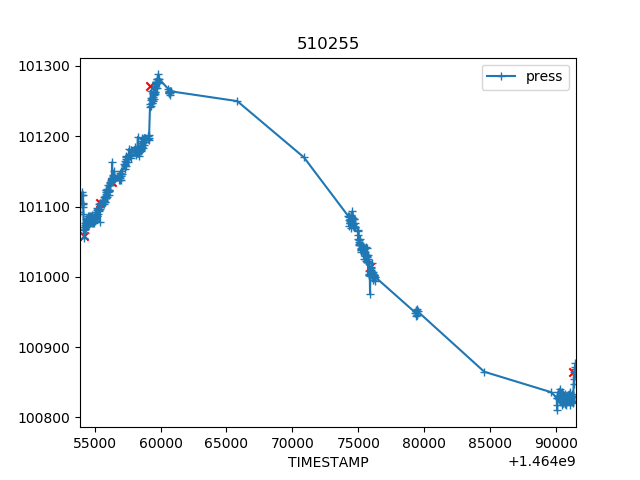

<IPython.core.display.Javascript object>


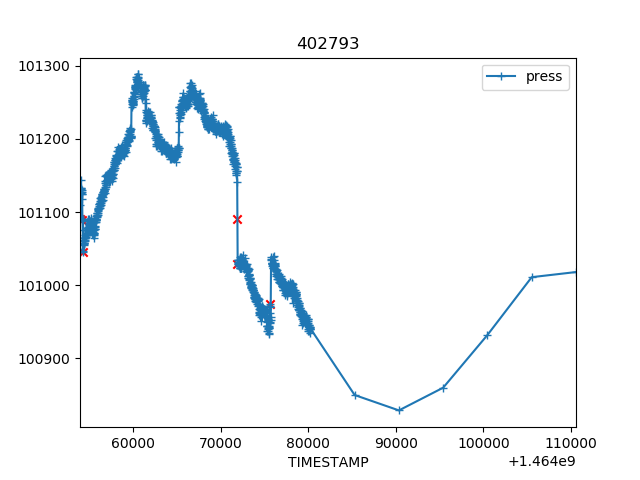

<IPython.core.display.Javascript object>


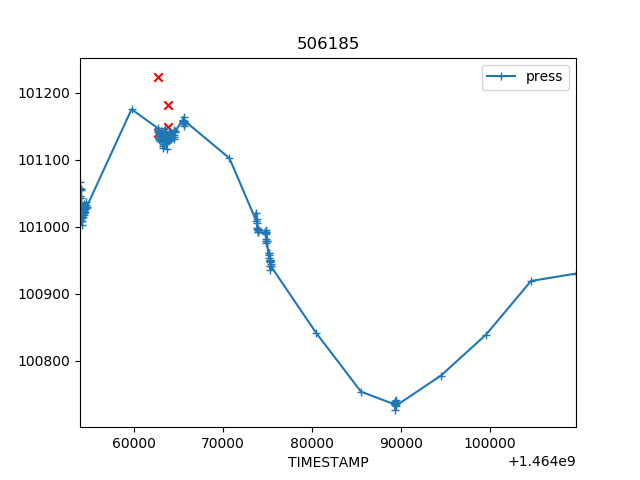

<IPython.core.display.Javascript object>


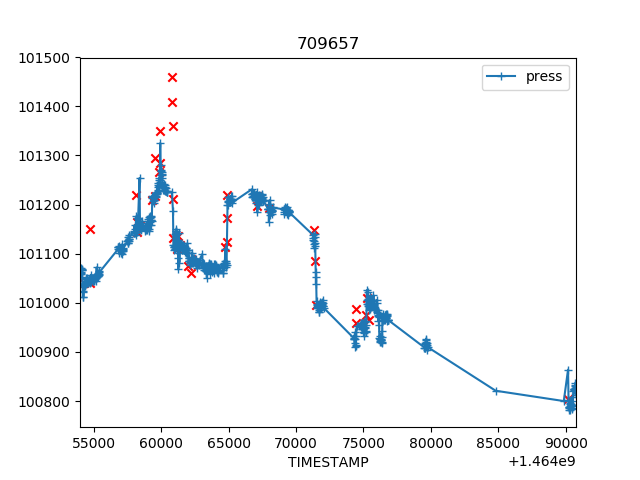

<IPython.core.display.Javascript object>


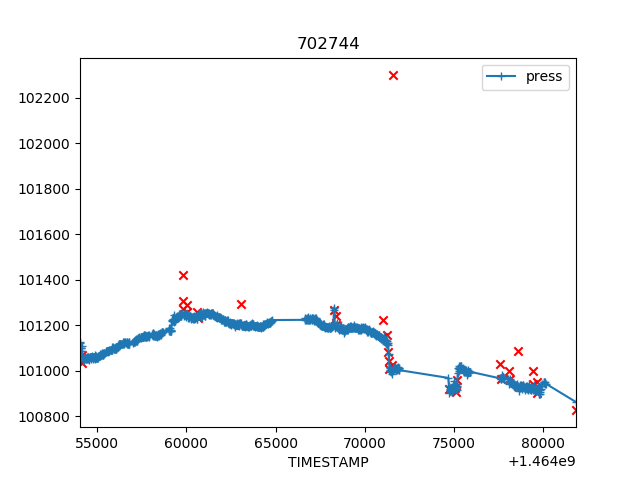

<IPython.core.display.Javascript object>


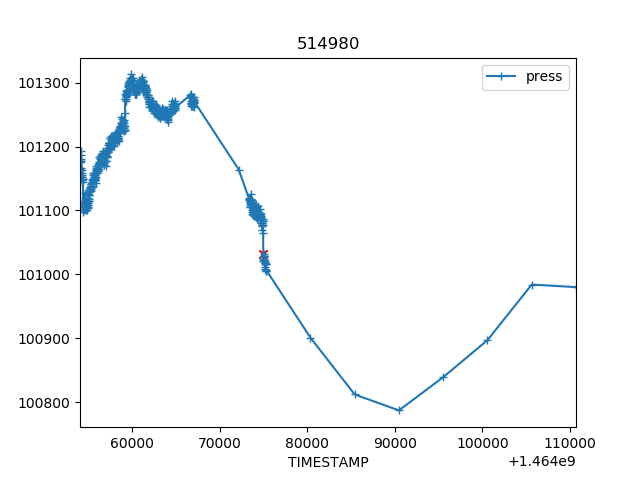

<IPython.core.display.Javascript object>


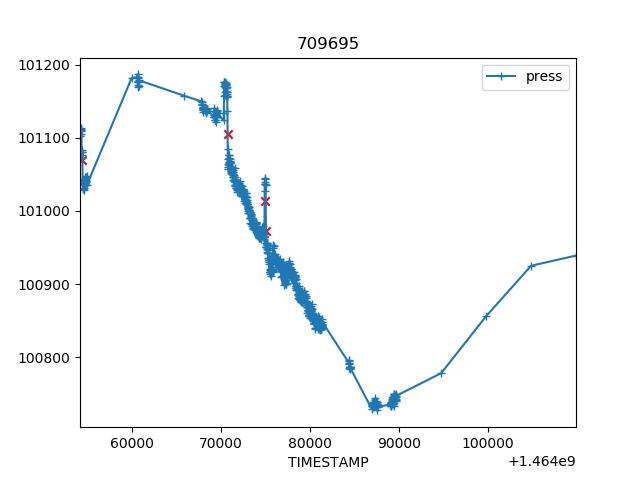

<IPython.core.display.Javascript object>


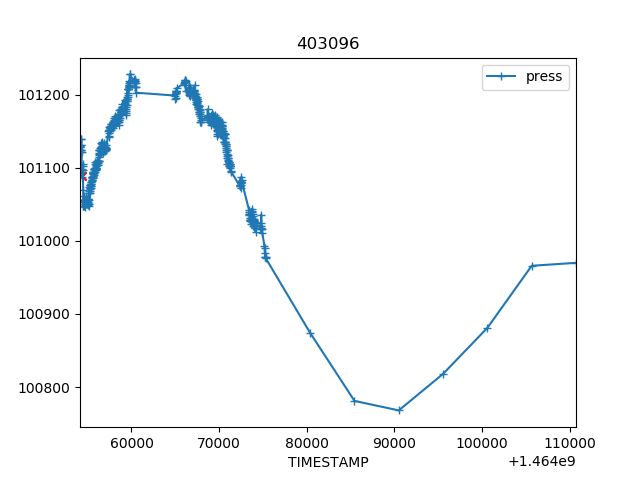

<IPython.core.display.Javascript object>


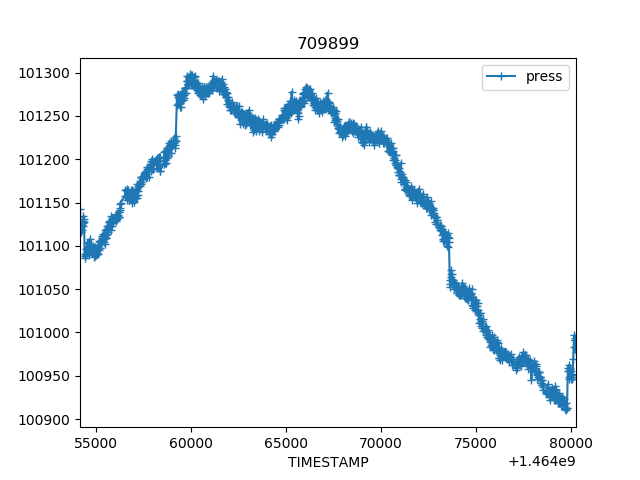

<IPython.core.display.Javascript object>


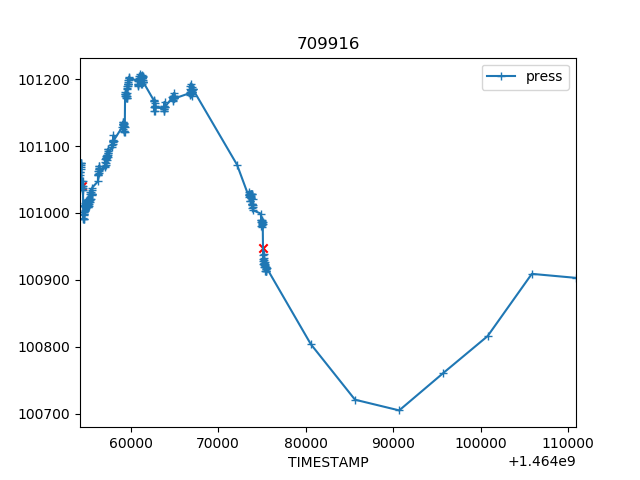

<IPython.core.display.Javascript object>


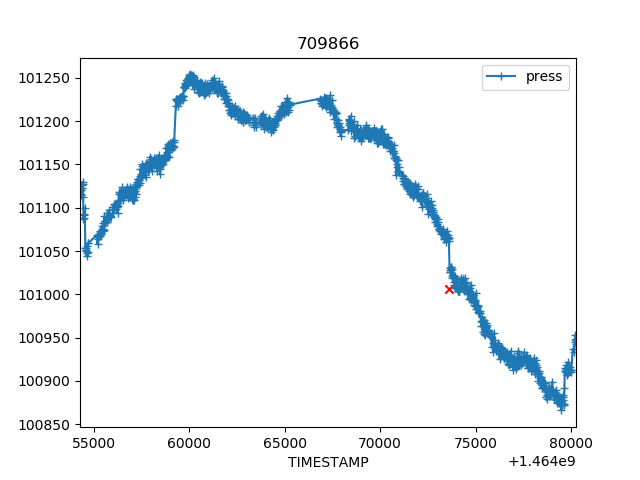

<IPython.core.display.Javascript object>


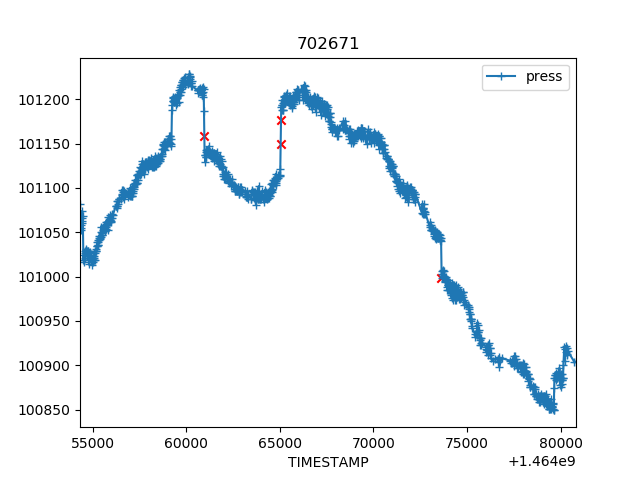

<IPython.core.display.Javascript object>


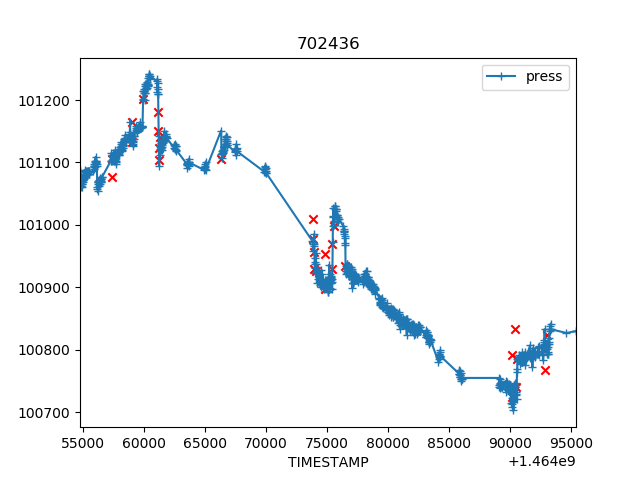

<IPython.core.display.Javascript object>


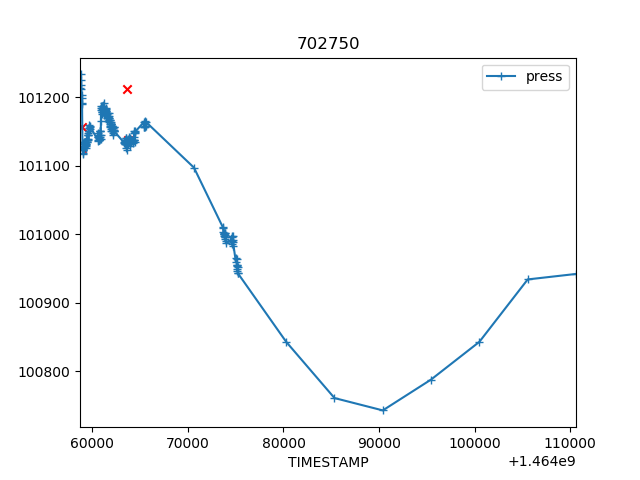

<IPython.core.display.Javascript object>


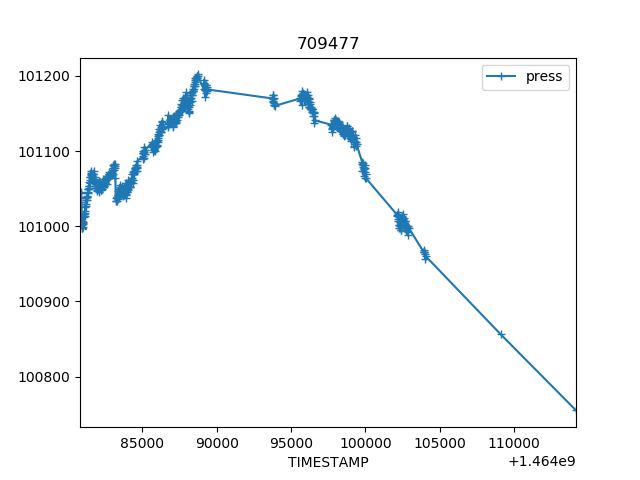

<IPython.core.display.Javascript object>


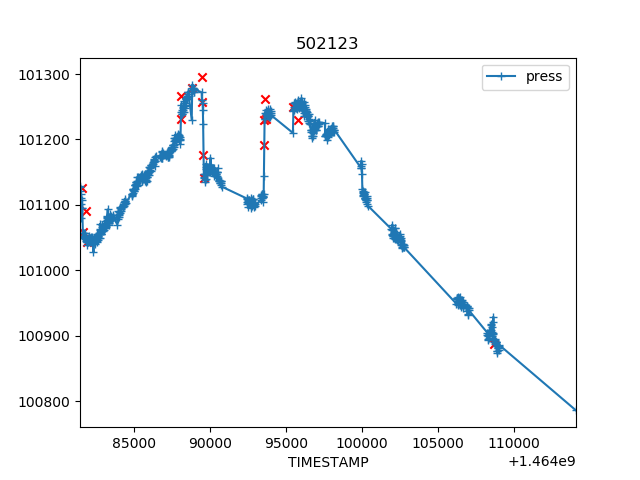

<IPython.core.display.Javascript object>


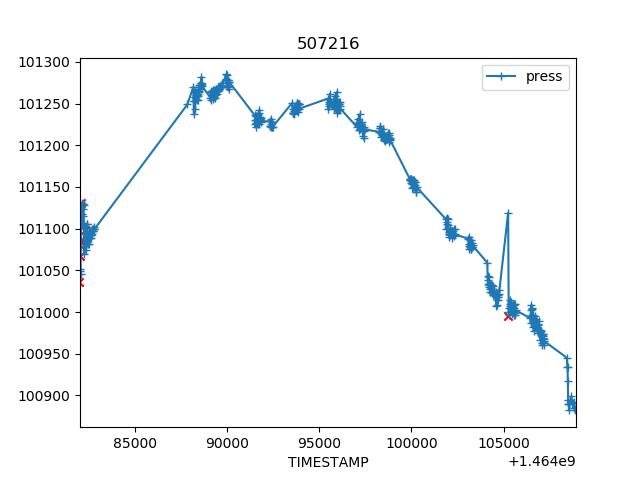

<IPython.core.display.Javascript object>


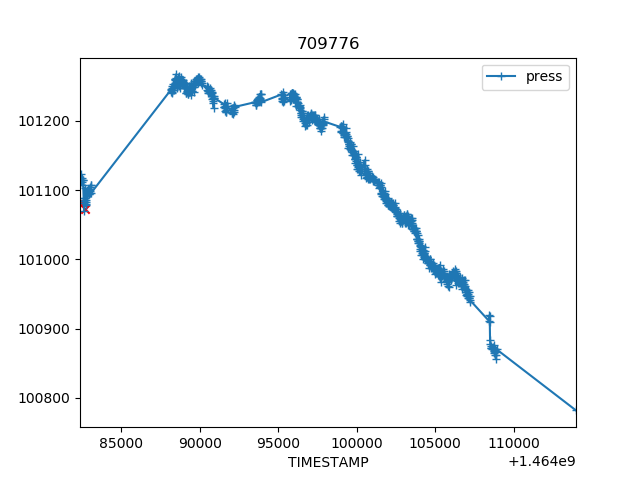

<IPython.core.display.Javascript object>


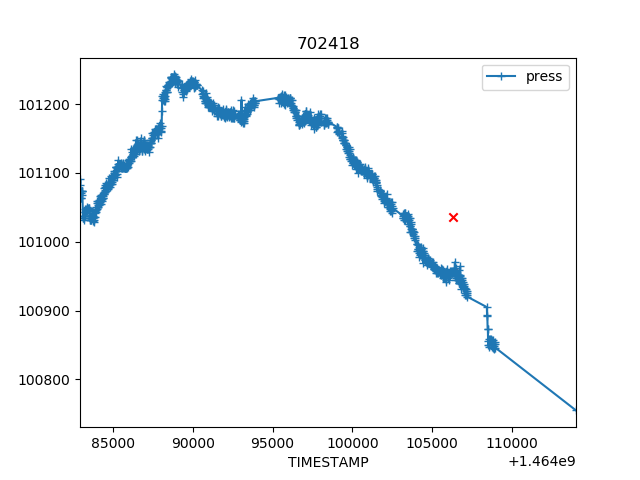

In [27]:
%matplotlib notebook
import matplotlib.pyplot as plt
ar = []
ar = dfin.nid.unique()
for o in range(len(ar)):
    stuv = df_vda.loc[df_vda['nid'] == ar[o]]
    stuh = df_hda.loc[df_hda['nid']==ar[o]]
    #d_vda.plot(x= df_vda['TIMESTAMP'],y = df_vda['press'],color = 'r',marker = '+')
    
    if not stuh.empty:
        d = stuh.plot(y = 'press',x = 'TIMESTAMP',marker = '+',title = ar[o])
    if not stuv.empty:
        plt.scatter(y=stuv['press'],x=stuv['TIMESTAMP'],color = 'r',marker = 'x')


<IPython.core.display.Javascript object>


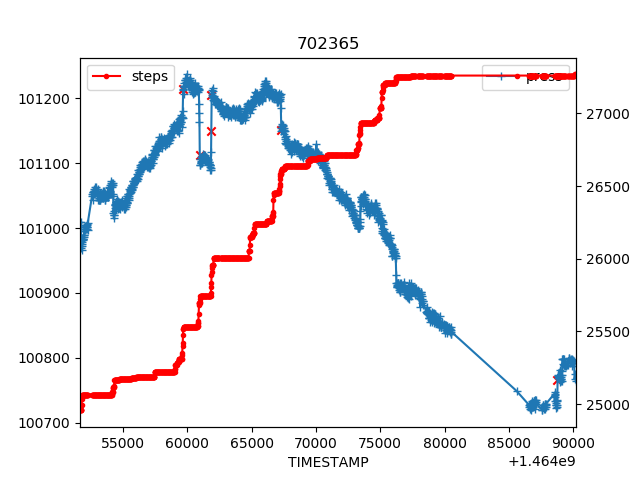

<IPython.core.display.Javascript object>


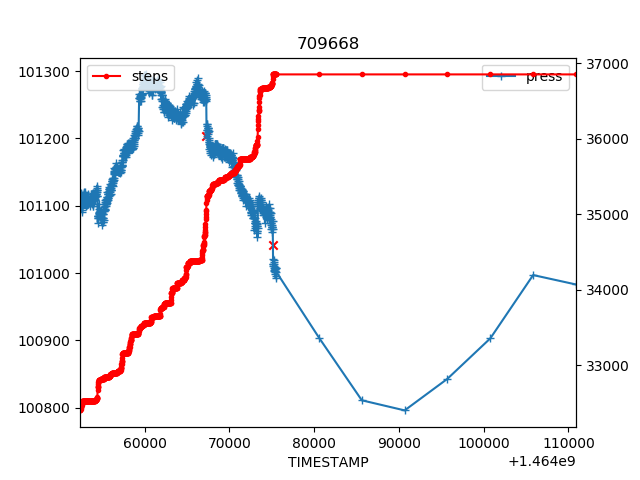

<IPython.core.display.Javascript object>


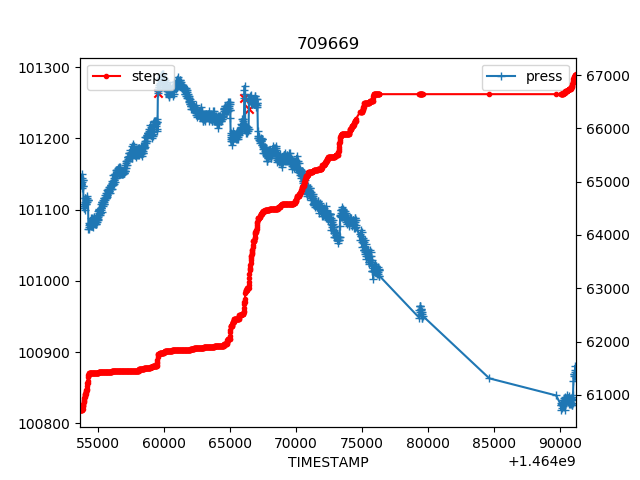

In [ ]:
%matplotlib notebook
import matplotlib.pyplot as plt
ar = [709669,709668,702365]
#ar = dfin.nid.unique()
#d = stuh.plot(y = 'press',x = 'TIMESTAMP',marker = '+',title = ar[0])

for o in range(len(ar)):
    stuv = df_vda.loc[df_vda['nid'] == ar[o]]
    stuh = df_hda.loc[df_hda['nid']==ar[o]]
    stu = dfin.loc[dfin['nid'] == ar[o]]
    #d_vda.plot(x= df_vda['TIMESTAMP'],y = df_vda['press'],color = 'r',marker = '+')
    
    if not stuh.empty:
        d = stuh.plot(y = 'press',x = 'TIMESTAMP',marker = '+',title = ar[o])
    if not stuv.empty:
        plt.scatter(y=stuv['press'],x=stuv['TIMESTAMP'],color = 'r',marker = 'x')
    d1 = d.twinx()
    stu.plot(y = 'steps',x = 'TIMESTAMP',marker = '.',title = ar[o],color = 'g',ax = d1)
    d.set_ylabel('Pressure(Pa)')
    d1.set_ylabel("Steps")

In [110]:
df_hda

,Unnamed: 0,Unnamed: 0.1,id,nid,sgt,rts,hum,light,mode,cmode,...,mac,lat,lon,acc,time,epoch_time,TIMESTAMP,press_change,steps_change,time_change
0,1,67,181188048,709616,2016-05-24 01:41:37,2016-06-24 05:44:52,72.5,0,1,1,...,"MAC:002675c22d6c RSSI:-77,MAC:7824af9482a8 RSS...",1.316632,103.761054,93,01:41:37,1.464034e+09,1.464034e+09,0.010483,0.000000,5056.0
1,1070,93,180510505,402920,2016-05-24 02:37:45,2016-06-24 07:10:29,49.0,0,1,1,...,"MAC:32cda7397c09 RSSI:-68,MAC:10feedc31e90 RSS...",1.314916,103.761871,90,02:37:45,1.464038e+09,1.464038e+09,0.010885,0.000000,5053.0
2,2,101,181188049,709616,2016-05-24 03:05:55,2016-06-24 05:44:52,72.5,0,1,1,...,"MAC:7824af9482a8 RSSI:-80,MAC:f81a673a837e RSS...",1.315601,103.761527,147,03:05:55,1.464039e+09,1.464039e+09,0.012060,0.000000,5058.0
3,1071,128,180510506,402920,2016-05-24 04:02:02,2016-06-24 07:10:29,49.5,0,1,1,...,"MAC:32cda7397c09 RSSI:-69,MAC:10feedc31e90 RSS...",1.314916,103.761871,90,04:02:02,1.464043e+09,1.464043e+09,0.021159,0.000000,5057.0
4,3,136,181188050,709616,2016-05-24 04:30:11,2016-06-24 05:44:52,72.5,0,1,1,...,"MAC:7824af9482a8 RSSI:-74,MAC:002675c22d6c RSS...",1.315601,103.761527,147,04:30:11,1.464044e+09,1.464044e+09,0.026108,0.000000,5056.0
5,1072,167,180510507,402920,2016-05-24 05:26:18,2016-06-24 07:10:29,49.5,0,1,1,...,"MAC:32cda7397c09 RSSI:-68,MAC:10feedc31e90 RSS...",1.314916,103.761871,90,05:26:18,1.464048e+09,1.464048e+09,0.004153,0.000000,5056.0
6,1306,204,180688582,709482,2016-05-24 05:54:10,2016-06-24 03:56:13,74.0,0,6,4,...,"MAC:9094e4fc0f2c RSSI:-79,MAC:48ee0c6cbf04 RSS...",1.316000,103.763824,157,05:54:10,1.464049e+09,1.464049e+09,0.312500,0.000000,16.0
8,4,207,181188051,709616,2016-05-24 05:54:26,2016-06-24 05:44:52,73.5,0,1,1,...,"MAC:7824af9482a8 RSSI:-77,MAC:002675c22d6c RSS...",1.315601,103.761527,147,05:54:26,1.464049e+09,1.464049e+09,0.024728,0.000000,5055.0
9,1308,210,180688585,709482,2016-05-24 05:54:58,2016-06-24 03:56:13,73.5,0,3,3,...,"MAC:d0c2826772f0 RSSI:-78,MAC:d0c2826772f6 RSS...",1.314846,103.762321,71,05:54:58,1.464049e+09,1.464049e+09,0.272727,0.333333,33.0
10,1309,212,180688586,709482,2016-05-24 05:55:16,2016-06-24 03:56:16,73.5,0,6,4,...,"MAC:d0c28266f373 RSSI:-71,MAC:d0c2826772f3 RSS...",1.314846,103.762321,71,05:55:16,1.464050e+09,1.464050e+09,1.500000,0.000000,18.0


<IPython.core.display.Javascript object>


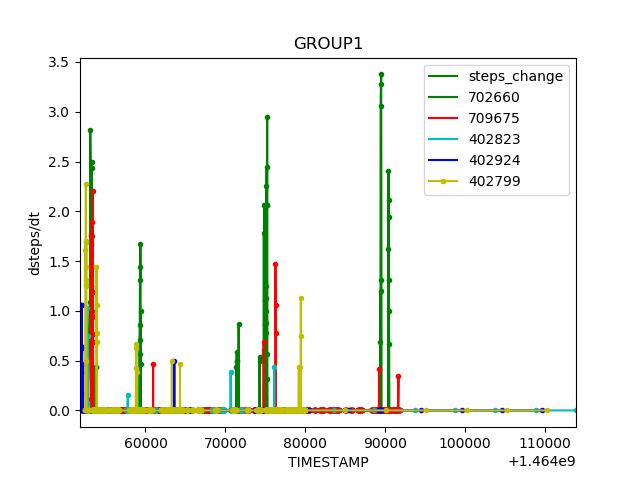

In [12]:
import pandas as pd
dfinal = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_Final.csv')
%matplotlib notebook
import matplotlib.pyplot as plt
#fig, ax = plt.subplots()
ar_grp = [702660,709675,402823,402924,402799]
col = ['g','r','c','b','y']
stu = dfinal.loc[dfinal['nid'] == ar_grp[0]]
d = stu.plot(x = 'TIMESTAMP',y = 'steps_change',color = 'g',title = 'GROUP1')
for o in range(len(ar_grp)):
    stu = dfinal.loc[dfinal['nid'] == ar_grp[o]]
    stu.plot(x = 'TIMESTAMP',y = 'steps_change',color = col[o],marker='.',label = ar_grp[o],ax = d)
    #d.set_xlim('1.464054e+09','1.464110e+09')
    plt.ylabel('dsteps/dt')
    #stu.to_csv('stu'+ar_grp[o])

<IPython.core.display.Javascript object>


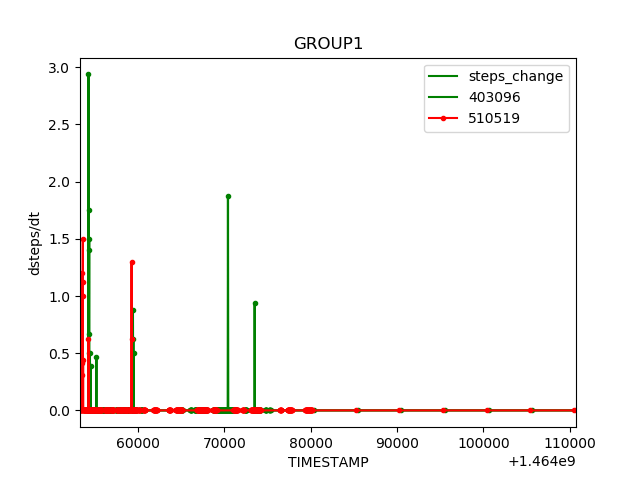

In [1]:
import pandas as pd
dfinal = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_Final.csv')
%matplotlib notebook
import matplotlib.pyplot as plt
#fig, ax = plt.subplots()
ar_grp = [403096,510519]
col = ['g','r']
stu = dfinal.loc[dfinal['nid'] == ar_grp[0]]
d = stu.plot(x = 'TIMESTAMP',y = 'steps_change',color = 'g',title = 'GROUP1')
for o in range(len(ar_grp)):
    stu = dfinal.loc[dfinal['nid'] == ar_grp[o]]
    stu.plot(x = 'TIMESTAMP',y = 'steps_change',color = col[o],marker='.',label = ar_grp[o],ax = d)
    #d.set_xlim('1.464054e+09','1.464110e+09')
    plt.ylabel('dsteps/dt')
    #stu.to_csv('stu'+ar_grp[o])

<IPython.core.display.Javascript object>


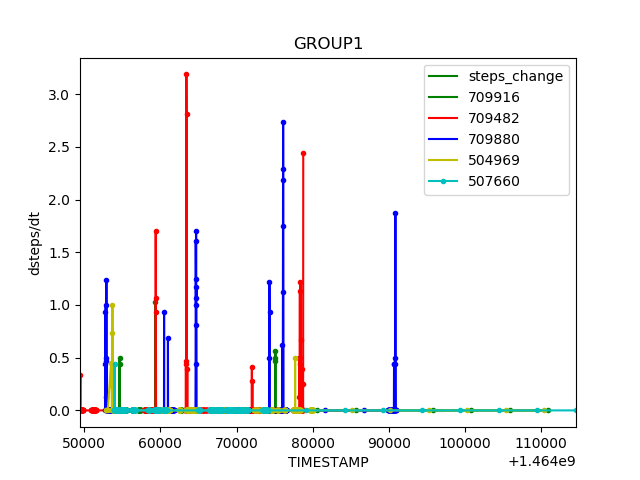

In [51]:
import pandas as pd
dfinal = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_Final.csv')
%matplotlib notebook
import matplotlib.pyplot as plt
#fig, ax = plt.subplots()
ar_grp = [709916,709482,709880,504969,507660]
col = ['g','r','b','y','c']
stu = dfinal.loc[dfinal['nid'] == ar_grp[0]]
d = stu.plot(x = 'TIMESTAMP',y = 'steps_change',color = 'g',title = 'GROUP1')
for o in range(len(ar_grp)):
    stu = dfinal.loc[dfinal['nid'] == ar_grp[o]]
    stu.plot(x = 'TIMESTAMP',y = 'steps_change',color = col[o],marker='.',label = ar_grp[o],ax = d)
    #d.set_xlim('1.464054e+09','1.464110e+09')
    plt.ylabel('dsteps/dt')
    #stu.to_csv('stu'+ar_grp[o])

In [52]:
print(stu['TIMESTAMP'],stu['time'])

2249     1464053888
2285     1464053904
2323     1464053922
2358     1464053938
2472     1464053988
2509     1464054004
2547     1464054020
2584     1464054036
2626     1464054054
2665     1464054070
2703     1464054086
2743     1464054104
2783     1464054120
2824     1464054135
2866     1464054152
2908     1464054168
2952     1464054186
2991     1464054202
3032     1464054218
3073     1464054234
3114     1464054250
3150     1464054265
3191     1464054282
3230     1464054298
3274     1464054316
3316     1464054332
3356     1464054347
3401     1464054364
3442     1464054380
3486     1464054398
            ...    
36835    1464073780
36874    1464073796
36914    1464073812
36965    1464073830
37006    1464073846
37040    1464073861
37078    1464073877
37119    1464073893
37164    1464073911
37203    1464073927
37241    1464073943
37285    1464073961
37321    1464073977
37357    1464073993
37390    1464074009
37423    1464074025
37466    1464074043
37496    1464074059
37531    1464074075


<IPython.core.display.Javascript object>


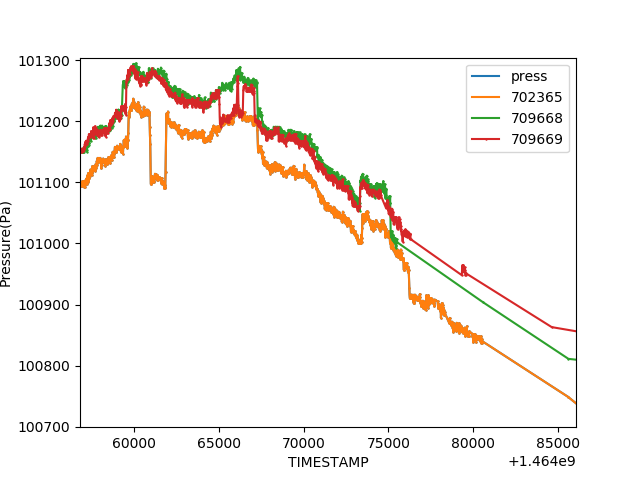

In [48]:
%matplotlib notebook
import matplotlib.pyplot as plt
ar = [702365,709668,709669]
#ar = dfin.nid.unique()
stuh = df_hda.loc[df_hda['nid']==ar[0]]

d = stuh.plot(y = 'press',x = 'TIMESTAMP',marker = '+',markersize = 1)
plt.ylabel('Pressure(Pa)')
for o in range(len(ar)):
    stuv = df_vda.loc[df_vda['nid'] == ar[o]]
    stuh = df_hda.loc[df_hda['nid']==ar[o]]
    stu = dfin.loc[dfin['nid'] == ar[o]]
    #d_vda.plot(x= df_vda['TIMESTAMP'],y = df_vda['press'],color = 'r',marker = '+')
    
    if not stuh.empty:
        d = stuh.plot(y = 'press',x = 'TIMESTAMP',marker = '+',markersize = 1,label = ar[o],ax = d)
    #if not stuv.empty:
        #.scatter(y=stuv['press'],x=stuv['time'],color = 'r',marker = 'x')
    #stu.plot(y='steps',x='time',color = 'r',marker = '.',ax = d.twinx())
    #d.figure.autofmt_xdate()
    #print(dfin['steps_change'])


### normalising press

/home/vidyaa/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


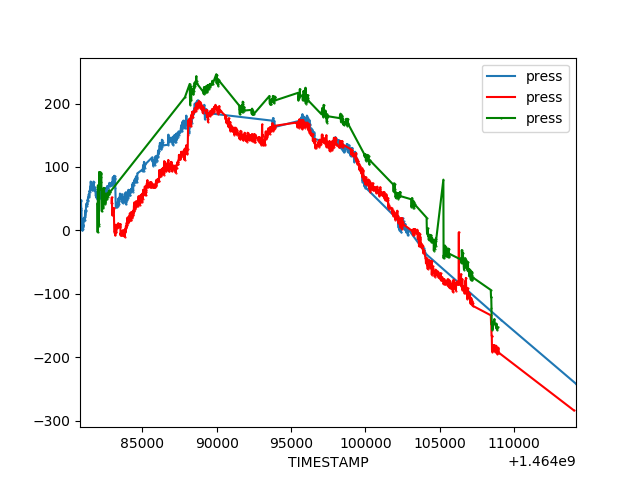

/home/vidyaa/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/vidyaa/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [87]:
%matplotlib notebook
import pandas as pd
dfinal = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_Final.csv')
ct=0
stu1 = dfinal.loc[dfinal['nid']== 709477]
for row in stu1['press']:
    ct +=1
    if ct==10:
        s1 = row
        break
stu1['press'] = stu1['press']-s1

d = stu1.plot(x = 'TIMESTAMP',y = 'press',marker='.',markersize =1)
stu = dfinal.loc[dfinal['nid']==702418]
ct=0
for row in stu['press']:
    ct +=1
    if ct==1000:
        s2 = row
        break

diff = s1 - s2
stu['press'] = stu['press']-s2
stu.plot(x= 'TIMESTAMP',y = 'press',marker='.',markersize = 1,color = 'r',ax = d)
stu2 = dfinal.loc[dfinal['nid']==507216]
ct=0
for row in stu2['press']:
    ct +=1
    if ct==1000:
        s2 = row
        break

diff = s1 - s2
stu2['press'] = stu2['press']-s2
stu2.plot(x= 'TIMESTAMP',y = 'press',marker='.',markersize = 1,color = 'g',ax = d)

<IPython.core.display.Javascript object>


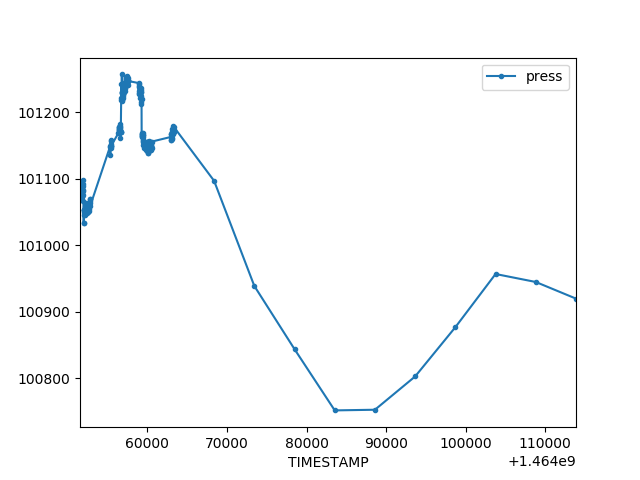

In [64]:
stu1 = dfinal.loc[dfinal['nid']==709673]
stu1.plot(x = 'TIMESTAMP',y = 'press',marker='.')

<IPython.core.display.Javascript object>


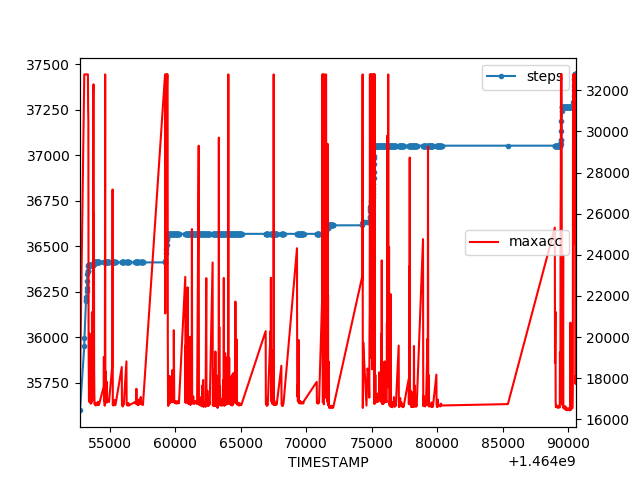

In [90]:
stu1 = dfinal.loc[dfinal['nid']==702660]
d = stu1.plot(x = 'TIMESTAMP',y = 'steps',marker='.')
stu1.plot(x='TIMESTAMP',y='maxacc',ax = d.twinx(),color = 'r')

In [7]:
for row in ['press']:
        diff = row
        break

In [8]:
diff

101109

<IPython.core.display.Javascript object>


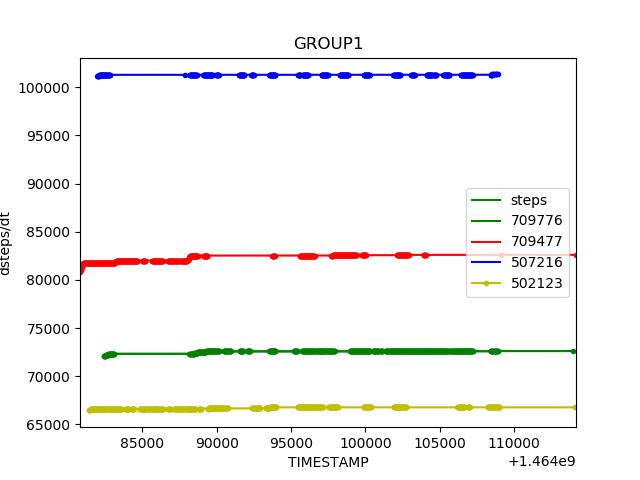

In [2]:
import pandas as pd
dfinal = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_Final.csv')
%matplotlib notebook
import matplotlib.pyplot as plt
#fig, ax = plt.subplots()
ar_grp = [709776,709477,507216,502123]
col = ['g','r','b','y']
stu = dfinal.loc[dfinal['nid'] == ar_grp[0]]
d = stu.plot(x = 'TIMESTAMP',y = 'steps',color = 'g',title = 'GROUP1')
for o in range(len(ar_grp)):
    stu = dfinal.loc[dfinal['nid'] == ar_grp[o]]
    stu.plot(x = 'TIMESTAMP',y = 'steps',color = col[o],marker='.',label = ar_grp[o],ax = d)
    #d.set_xlim('1.464054e+09','1.464110e+09')
    plt.ylabel('dsteps/dt')
    #stu.to_csv('stu'+ar_grp[o])

<IPython.core.display.Javascript object>


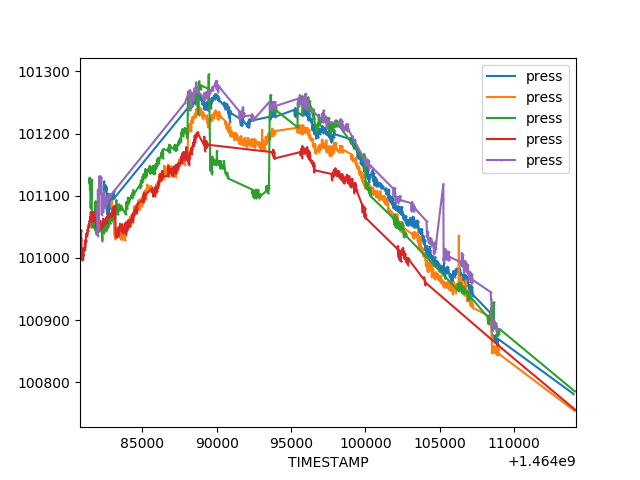

In [5]:
stu = dfinal.loc[dfinal['nid']==709776]
d = stu.plot(x = 'TIMESTAMP',y = 'press',marker='.',markersize =1)
stu = dfinal.loc[dfinal['nid']==702418]
stu.plot(x = 'TIMESTAMP',y = 'press',marker='.',markersize =1,ax = d)
stu = dfinal.loc[dfinal['nid']==502123]
stu.plot(x = 'TIMESTAMP',y = 'press',marker='.',markersize =1,ax = d)
stu = dfinal.loc[dfinal['nid']==709477]
stu.plot(x = 'TIMESTAMP',y = 'press',marker='.',markersize =1,ax = d)
stu = dfinal.loc[dfinal['nid']==507216]
stu.plot(x = 'TIMESTAMP',y = 'press',marker='.',markersize =1,ax = d)


<IPython.core.display.Javascript object>


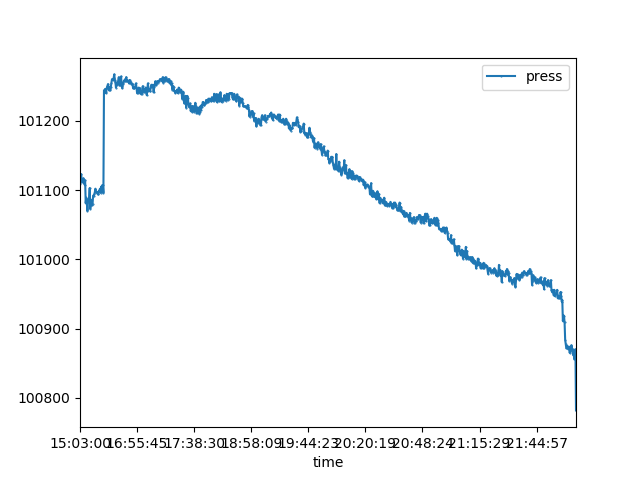

In [37]:
stu = dfinal.loc[dfinal['nid']==709776]
d = stu.plot(x = 'time',y = 'press',marker='.',markersize =1)


<IPython.core.display.Javascript object>


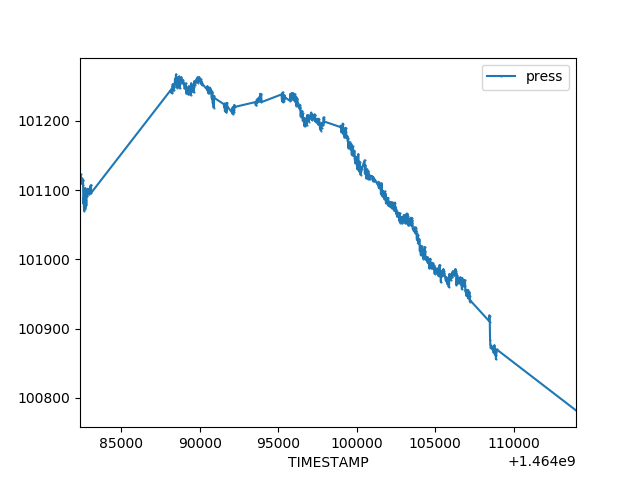

In [39]:
stu = dfinal.loc[dfinal['nid']==709776]
d = stu.plot(x = 'TIMESTAMP',y = 'press',marker='.',markersize =1)


<IPython.core.display.Javascript object>


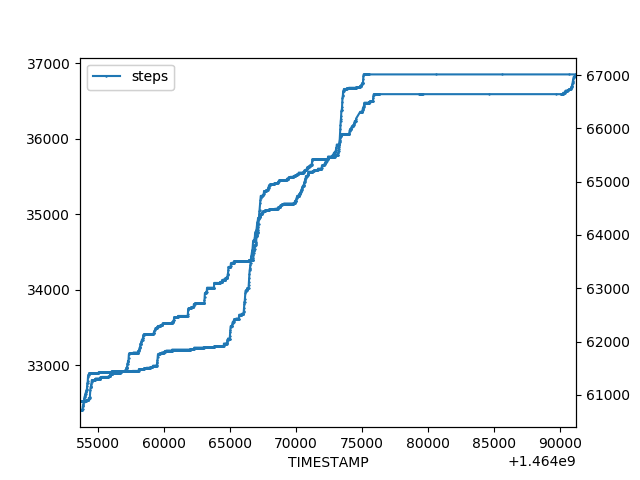

In [60]:
%matplotlib notebook
import matplotlib.pyplot as plt
ar = [709668,709669]
stu = dfin.loc[dfin['nid'] == ar[0]]

d = stu.plot(y = 'steps',x = 'TIMESTAMP',marker = '+',markersize = 1)
stu = dfin.loc[dfin['nid'] == ar[1]]
stu.plot(y = 'steps',x = 'TIMESTAMP',marker = '+',markersize = 1,ax = d.twinx())



<IPython.core.display.Javascript object>


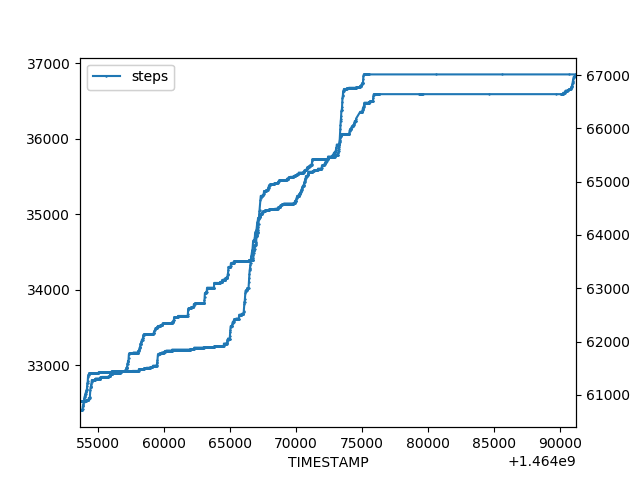

In [61]:
%matplotlib notebook
import matplotlib.pyplot as plt
ar = [709668,709669]
stu = df_hda.loc[dfin['nid'] == ar[0]]

d = stu.plot(y = 'steps',x = 'TIMESTAMP',marker = '+',markersize = 1)
stu = df_hda.loc[dfin['nid'] == ar[1]]
stu.plot(y = 'steps',x = 'TIMESTAMP',marker = '+',markersize = 1,ax = d.twinx())



<IPython.core.display.Javascript object>


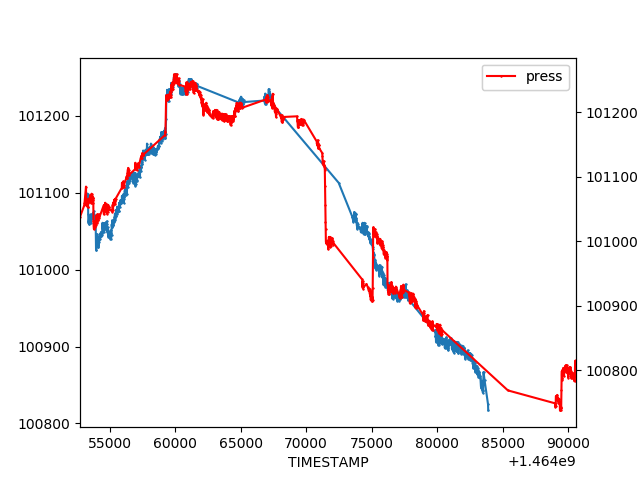

In [30]:
%matplotlib notebook
import matplotlib.pyplot as plt
ar = [702364,702660]
stu = dfinal.loc[dfinal['nid'] == ar[0]]

d = stu.plot(y = 'press',x = 'TIMESTAMP',marker = '+',markersize = 1)
stu = dfinal.loc[dfinal['nid'] == ar[1]]
stu.plot(y = 'press',x = 'TIMESTAMP',marker = '+',markersize = 1,color = 'r',ax = d.twinx())



### correlation matrix 

In [131]:
cor_steps = stud.corr()
cor_steps.style.background_gradient(cmap='coolwarm').set_precision(5)


### correlation matrix excluding zero values

In [35]:
cor_steps = stud.corr()[stud.columns !='709455']
cor_steps.style.background_gradient(cmap='coolwarm').set_precision(5)


In [ ]:
import pandas as pd
dfinal = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_Final.csv')
%matplotlib notebook
import matplotlib.pyplot as plt
#fig, ax = plt.subplots()
ar_grp = [702660,709675,402823,402924,402799]
col = ['g','r','c','b','y']
stu = dfinal.loc[dfinal['nid'] == ar_grp[0]]
d = stu.plot(x = 'TIMESTAMP',y = 'steps_change',color = 'g',title = 'GROUP1')
for o in range(len(ar_grp)):
    stu = dfinal.loc[dfinal['nid'] == ar_grp[o]]
    stu.plot(x = 'TIMESTAMP',y = 'steps_change',color = col[o],marker='.',label = ar_grp[o],ax = d)
    #d.set_xlim('1.464054e+09','1.464110e+09')
    plt.ylabel('dsteps/dt')
    #stu.to_csv('stu'+ar_grp[o])import pandas as pd
dfinal = pd.read_csv('/home/vidyaa/nse_school_analysis/Tue_Final.csv')
%matplotlib notebook
import matplotlib.pyplot as plt
#fig, ax = plt.subplots()
ar_grp = [702660,709675,402823,402924,402799]
col = ['g','r','c','b','y']
stu = dfinal.loc[dfinal['nid'] == ar_grp[0]]
d = stu.plot(x = 'TIMESTAMP',y = 'steps_change',color = 'g',title = 'GROUP1')
for o in range(len(ar_grp)):
    stu = dfinal.loc[dfinal['nid'] == ar_grp[o]]
    stu.plot(x = 'TIMESTAMP',y = 'steps_change',color = col[o],marker='.',label = ar_grp[o],ax = d)
    #d.set_xlim('1.464054e+09','1.464110e+09')
    plt.ylabel('dsteps/dt')
    #stu.to_csv('stu'+ar_grp[o])

### correlation matrix after removal of outlirers

In [66]:
import pandas as pd
df = pd.read_csv('/home/vidyaa/nse_school_analysis/data/Tue_Final.csv')
final_df = pd.DataFrame()
final_node = []
import networkx as nx
node_list = df.nid.unique()
for i in node_list:
    if df.loc[df.nid == i].nid.count()>600:
        dnew = df.loc[df.nid == i]
        final_node.append(i)
        final_df = final_df.append(dnew)

In [67]:
import numpy as np
import time
t1 = []
grp = final_df.groupby(final_df['sgt'])
datetime = pd.to_datetime(final_df['sgt'])
times = datetime.dt.time
final_df['time']= times
epoch_time = [time.mktime((int(rectime[0:4]), int(rectime[5:7]), int(rectime[8:10]),int(rectime[11:13]) ,int(rectime[14:16]) ,int(rectime[17:19]), 0,0,0 ) ) for rectime in final_df['sgt']]
final_df['TIMESTAMP']=epoch_time

In [72]:
import numpy as np
import time
t1 = []
grp = final_df.groupby(final_df['sgt'])
datetime = pd.to_datetime(final_df['sgt'])
times = datetime.dt.time
final_df['time']= times
epoch_time = [time.mktime((int(rectime[0:4]), int(rectime[5:7]), int(rectime[8:10]),int(rectime[11:13]) ,int(rectime[14:16]) ,int(rectime[17:19]), 0,0,0 ) ) for rectime in final_df['sgt']]
final_df['TIMESTAMP']=epoch_time
time_every_min=np.linspace(1464029241,1464114176,100)
time_every_min=[int(x) for x in time_every_min]
from bisect import bisect_left
def takeClosest(myList, myNumber):
    """
    Assumes myList is sorted. Returns closest value to myNumber.

    If two numbers are equally close, return the smallest number.
    """
    pos = bisect_left(myList, myNumber)
    if pos == 0:
        return myList[0]
    if pos == len(myList):
        return myList[-1]
    before = myList[pos - 1]
    after = myList[pos]
    if after - myNumber < myNumber - before:
        return after
    else:
        return before

for index, row in final_df.iterrows():
        timestamp=row['TIMESTAMP']
        t1.append(takeClosest(time_every_min, timestamp))
final_df['final_TS'] = t1

In [69]:
st  = pd.DataFrame()
ct=0
stu  = []
fin = final_df.groupby(final_df.final_TS)
for f in fin:
    node_list = f[1].nid.unique()
    for i in final_node:
        #stu[str(i)].append(f[1].loc[f[1].nid == i].steps.mean())
        if i in node_list:
            st.at[ct,str(i)] = f[1].loc[f[1].nid==i].steps_change.mean()
        else:
            st.at[ct,str(i)] = 0.0
    ct+=1  

### press_chaNGE

In [70]:
st  = pd.DataFrame()
ct=0
stu  = []
fin = final_df.groupby(final_df.final_TS)
for f in fin:
    node_list = f[1].nid.unique()
    for i in final_node:
        #stu[str(i)].append(f[1].loc[f[1].nid == i].steps.mean())
        if i in node_list:
            st.at[ct,str(i)] = f[1].loc[f[1].nid==i].press_change.sum()
        else:
            st.at[ct,str(i)] = 0.0
    ct+=1  

In [70]:
cor_steps = st.corr()
cor_steps.style.background_gradient(cmap='coolwarm').set_precision(5)


In [58]:
st.to_csv('Tue_check.csv')

In [83]:
stuv['final_TS']

47234    1464082857
47239    1464082857
47246    1464083027
47251    1464083027
47257    1464083027
47263    1464083027
47269    1464083027
47275    1464083027
47281    1464083027
47287    1464083027
47299    1464083027
47305    1464083197
47311    1464083197
47317    1464083197
47323    1464083197
47329    1464083197
47334    1464083197
47340    1464083197
47346    1464083197
47352    1464083197
47357    1464083197
47363    1464083197
47369    1464083367
47375    1464083367
47381    1464083367
47386    1464083367
47391    1464083367
47396    1464083367
47401    1464083367
47406    1464083367
            ...    
53270    1464107197
53341    1464108388
53345    1464108388
53349    1464108559
53353    1464108559
53357    1464108559
53361    1464108559
53365    1464108559
53369    1464108559
53372    1464108559
53376    1464108559
53378    1464108559
53387    1464108729
53389    1464108729
53392    1464108729
53399    1464108729
53403    1464108729
53408    1464108729
53413    1464108729


In [73]:
st  = pd.DataFrame()
ct=0
stu  = []
node_list =[]
fin = final_df.groupby(final_df.final_TS)
for f in fin:
    node_list = f[1].nid.unique()
    for i in final_node:
        
        #stu[str(i)].append(f[1].loc[f[1].nid == i].steps.mean())
        if i in node_list:
            st.at[ct,str(i)]=int(f[1].loc[f[1].nid==i].press_change.sum()/3)
        else:
            st.at[ct,str(i)]=0.0
    st.at[ct,'TIMESTAMP'] = f[0]
    ct+=1 


In [56]:
st  = pd.DataFrame()
ct=0
stu  = []
fin = final_df.groupby(final_df.final_TS)
for f in fin:
    node_list = f[1].nid.unique()
    print(node_list)
    for i in final_node:
        #stu[str(i)].append(f[1].loc[f[1].nid == i].steps.mean())
        if i in node_list:
            print(f[1].loc[f[1].nid==i].press_change.sum())
        else:
            st.at[ct,str(i)]=0.0
    st.at[ct,'TIMESTAMP'] = f[0]
    ct+=1 


[709616]
-53.0
[709616]
-61.0
[709616]
-132.0
[709616]
125.0
[709616]
27.0
[709616]
13.0
[709616]
2.0
[709616]
-5.0
[501890]
-26.0
[501890]
-26.0
[709616 501890 402371]
-19.0
2.0
0.0
[709616 501890 402371]
1.0
-38.0
-38.0
[709616 501890 402371 702365]
2.0
22.0
17.0
15.0
[501890 402371 702365]
0.0
-1.0
17.0
[709616 501890 402371 702365]
27.0
4.0
9.0
15.0
[709616 501890 402371 702365 709753]
6.0
9.0
18.0
4.0
43.0
[709616 501890 402371 709753 709668 402799]
68.0
-11.0
5.0
16.0
19.0
-20.0
[709616 501890 402371 702365 709753 709668 402799 514590 501906 514270]
62.0
4.0
33.0
44.0
19.0
-9.0
-33.0
47.0
0.0
-30.0
[709616 501890 702365 709753 709668 402799 514590 501906 514270 702660]
-19.0
3.0
5.0
-3.0
16.0
1.0
-63.0
-17.0
18.0
19.0
[709616 501890 402371 702365 709753 709668 402799 514590 501906 514270
 509365]
-9.0
18.0
-7.0
0.0
-8.0
-9.0
7.0
13.0
-9.0
1.0
-35.0
[709616 501890 402371 702365 709753 709668 514590 501906 514270 702660
 514786 509365 709675 709721 508343 709010]
10.0
7.0
1.0
-13.0

12.0
19.0
25.0
10.0
7.0
12.0
19.0
15.0
-5.0
15.0
-4.0
16.0
0.0
13.0
-4.0
15.0
16.0
11.0
15.0
16.0
7.0
[709616 501890 402371 702365 709668 402799 514590 501906 702660 514786
 509365 702685 709716 709675 508343 702364 709731 510519 514500 709669
 709713 702744 513183 402793 514980 403096 709899 709866 702671 702436]
13.0
-31.0
-5.0
-1.0
13.0
-9.0
-1.0
10.0
-8.0
8.0
8.0
13.0
9.0
8.0
15.0
0.0
16.0
19.0
58.0
8.0
7.0
5.0
8.0
16.0
-1.0
9.0
14.0
0.0
8.0
1.0
[709616 501890 402371 702365 709753 709668 402799 514590 501906 514270
 514786 509365 702685 709524 709675 709721 508343 702364 709731 510519
 514500 709669 709713 702744 513183 402793 514980 403096 709899 709866
 702671]
-6.0
-1.0
0.0
12.0
70.0
7.0
2.0
4.0
-6.0
29.0
-2.0
5.0
-10.0
21.0
3.0
11.0
-4.0
10.0
-9.0
5.0
-12.0
-2.0
3.0
-3.0
3.0
4.0
0.0
-4.0
1.0
8.0
1.0
[709616 501890 402371 702365 709753 709668 402799 514590 501906 514270
 514786 509365 702685 709524 709675 709721 508343 709010 702364 709731
 510519 514500 709669 709713 709657 702

-23.0
2.0
0.0
-8.0
5.0
-3.0
-44.0
-17.0
8.0
7.0
0.0
-6.0
-4.0
1.0
6.0
[709616 402371 702365 709753 709668 402799 514590 501906 702660 514786
 509365 702685 709716 709524 709675 709721 709010 702364 510519 514500
 403037 402866 709669 709713 515078 709657 702744 513183 402793 514980
 709899 709866 702671 702436]
-10.0
2.0
-4.0
-16.0
-17.0
-27.0
-5.0
-3.0
-16.0
-14.0
-2.0
-11.0
1.0
2.0
-12.0
2.0
-11.0
-10.0
8.0
-9.0
-24.0
-8.0
-19.0
-5.0
-10.0
-3.0
3.0
-14.0
9.0
-14.0
-1.0
0.0
-2.0
9.0
[709616 402371 702365 709753 709668 402799 514590 501906 514786 709524
 709675 709721 709010 702364 514500 403037 402866 709669 709713 515078
 709657 702744 513183 402793 514980 403096 709899 709866 702436]
-2.0
-5.0
-13.0
0.0
0.0
21.0
-13.0
-9.0
-16.0
-8.0
-1.0
-6.0
-6.0
-9.0
6.0
2.0
-11.0
3.0
-6.0
-3.0
-8.0
0.0
-13.0
13.0
6.0
-17.0
-12.0
-9.0
4.0
[709616 501890 402371 702365 709753 709668 402799 514590 501906 514786
 509365 702685 709716 709524 709675 709721 709010 702364 709731 510519
 514500 403037 402

-6.0
9.0
-5.0
78.0
10.0
9.0
-47.0
51.0
8.0
-11.0
0.0
13.0
0.0
2.0
13.0
-3.0
63.0
-12.0
[709616 501890 702365 709753 709668 402799 501906 702660 514786 509365
 702685 709716 709524 709675 709721 508343 702364 510519 514500 403037
 402866 709669 709713 515078 709657 513183 402793 403096 709899 709866
 702671]
5.0
-10.0
8.0
2.0
9.0
-5.0
4.0
-6.0
8.0
-23.0
3.0
-9.0
-29.0
-7.0
-3.0
-3.0
-4.0
2.0
9.0
-1.0
-5.0
4.0
0.0
3.0
9.0
7.0
43.0
4.0
8.0
2.0
19.0
[709616 501890 702365 709668 402799 514590 514786 509365 709716 709524
 709675 709731 514500 403037 709669 709713 515078 709657 513183 402793
 709899 709866 702671]
-1.0
-9.0
6.0
2.0
-4.0
-6.0
-15.0
-6.0
5.0
4.0
4.0
2.0
-12.0
-3.0
4.0
12.0
6.0
-13.0
0.0
15.0
-6.0
6.0
8.0
[501890 702365 709668 514590 514786 509365 709716 709524 709675 709731
 403037 709669 709713 513183 402793 709899 702671]
-3.0
-4.0
3.0
11.0
9.0
2.0
-1.0
4.0
-3.0
125.0
0.0
-5.0
-5.0
-2.0
5.0
-6.0
0.0
[702365 709668 514590 514786 709716 709675 709731 709669 709713 513183
 40279

8.0
3.0
-6.0
-1.0
-32.0
[702365 709753 709668 514590 514270 514786 509365 702685 709716 709524
 709010 709731 709669 709713 515078 702744 513183 402793 403096 709899
 709866 702671 702436]
-8.0
-42.0
3.0
-10.0
0.0
0.0
-6.0
-7.0
-2.0
11.0
-4.0
-2.0
1.0
-19.0
6.0
-14.0
0.0
-3.0
1.0
-14.0
8.0
-5.0
-3.0
[709616 702365 709668 514590 514270 514786 509365 702685 709716 709010
 709731 514500 403037 709669 709713 515078 702744 513183 402793 709695
 403096 709899 709866 702671]
-9.0
2.0
-3.0
-3.0
4.0
-3.0
-3.0
-3.0
0.0
-4.0
2.0
-15.0
-5.0
-2.0
0.0
-11.0
-5.0
0.0
-5.0
42.0
-8.0
0.0
-11.0
-5.0
[709616 702365 709668 514270 514786 509365 709716 709524 709010 514500
 403037 709669 709713 515078 702744 513183 402793 709695 403096 709899
 709866 702671]
1.0
-16.0
-10.0
-14.0
-6.0
-8.0
-8.0
-10.0
-3.0
0.0
-3.0
-10.0
-8.0
-5.0
0.0
-7.0
10.0
-7.0
-3.0
0.0
0.0
-9.0
[702365 709668 514270 514786 509365 709716 709524 709010 709669 709713
 515078 702744 513183 402793 709695 403096 709899 709866 702671]
2.0
-6.

0.0
-7.0
-4.0
-5.0
-16.0
-4.0
10.0
-3.0
-17.0
-13.0
11.0
30.0
-11.0
7.0
-60.0
-91.0
-11.0
-8.0
-5.0
-16.0
[402371 702365 709753 709668 402799 514590 514270 702660 514786 509365
 709716 709524 709675 508343 702364 709731 402866 709669 709713 515078
 709657 702744 513183 402793 514980 709695 403096 709899 709866 702671
 702436]
-25.0
-7.0
-25.0
-69.0
-4.0
0.0
-61.0
33.0
-12.0
-29.0
-27.0
-5.0
-9.0
-51.0
-8.0
28.0
-20.0
-2.0
-37.0
-5.0
46.0
57.0
8.0
-22.0
-7.0
-11.0
-32.0
-15.0
-8.0
-24.0
24.0
[402371 702365 709753 709668 402799 514590 514270 702660 514786 509365
 709716 709675 508343 702364 709731 514500 403037 402866 709669 709713
 709657 702744 513183 402793 514980 709695 403096 709899 709866 702671
 702436]
-10.0
-13.0
-4.0
-15.0
-5.0
-3.0
-12.0
-12.0
85.0
-11.0
89.0
-19.0
-16.0
-13.0
-2.0
-32.0
-35.0
-6.0
-9.0
3.0
-12.0
8.0
-27.0
10.0
-9.0
-12.0
-8.0
-9.0
-21.0
-7.0
-7.0
[702365 709668 402799 514590 514270 702660 514786 709716 709675 508343
 702364 709731 514500 403037 402866 709669 

-27.0
-9.0
-6.0
72.0
-10.0
-1.0
19.0
[709616 709753 709524 709675 702364 709695 702436 709477]
-82.0
-70.0
-80.0
5.0
-4.0
8.0
-6.0
16.0
[709616 402371 709753 702364 514500 515078 702436 709477 502123]
18.0
-74.0
2.0
8.0
-72.0
-89.0
5.0
19.0
-9.0
[709616 709753 702364 702436 709477 502123]
-13.0
-6.0
-3.0
-12.0
-7.0
-75.0
[709616 709675 709010 702364 702744 702436 709477 502123]
4.0
1.0
-48.0
-9.0
-114.0
0.0
-15.0
-7.0
[709675 702364 702436 709477 502123]
-4.0
4.0
0.0
-2.0
3.0
[709675 702364 702436 709477 502123]
-12.0
-8.0
-6.0
7.0
0.0
[709675 702364 702436 709477 502123 709776]
0.0
-3.0
-3.0
4.0
1.0
14.0
[709753 702364 702436 709477 502123 709776]
-12.0
-4.0
8.0
7.0
4.0
-42.0
[709753 702364 702436 709477 502123 709776]
-12.0
-11.0
0.0
5.0
10.0
-3.0
[702364 709477 502123 709776 702418]
0.0
1.0
4.0
16.0
22.0
[709675 702364 702436 709477 502123 709776 702418]
-19.0
-8.0
-15.0
10.0
3.0
2.0
-53.0
[709675 702364 702436 709477 502123 702418]
-6.0
-3.0
-2.0
-41.0
7.0
7.0
[709675 702364 702436

[709776 702418]
2.0
2.0
[502123 709776 702418]
-77.0
2.0
0.0
[502123 709776 702418]
1.0
-12.0
4.0
[502123 709776 702418]
-8.0
-3.0
-8.0
[502123 709776 702418]
-3.0
-3.0
13.0
[502123 709776 702418]
-16.0
-9.0
-22.0
[502123 709776 702418]
7.0
-12.0
-19.0
[709776 702418]
-3.0
-3.0
[709616]
61.0
[709616]
-14.0
[709616]
9.0
[709616]
1.0
[709616]
-3.0
[709616 502123]
1.0
-45.0
[502123 709776 702418]
23.0
-23.0
-27.0
[502123 709776 702418]
12.0
-43.0
-35.0
[709616 502123 709776 702418]
-8.0
-38.0
-5.0
-1.0
[709616 502123 709776 702418]
0.0
-10.0
0.0
-11.0
[709477 502123]
-104.0
5.0
[709695]
14.0
[402799]
-1.0
[501906 510519]
1.0
8.0
[702685 709721 402793]
-5.0
-6.0
7.0
[509365 709713 514980 403096]
5.0
4.0
-4.0
4.0
[709668 514270 508343]
-14.0
-9.0
-7.0
[709616 502123 709776 702418]
-8.0
-100.0
-88.0
-91.0
[709477]
-101.0


In [55]:
f[0]

1464114176

In [39]:
for i in final_node:
    st.replace({str(i):st[str(i)]>2.5}, int(st[str(i)]/2.5),inplace=True)
    st.replace({str(i):st[str(i)]<2.5}, 0,inplace=True)
    st.replace({str(i):st[str(i)]<-2.5}, int(abs(st[str(i)])/2.5),inplace=True)

TypeError: cannot convert the series to <class 'int'>

In [74]:

col = st.loc[: , str(final_node[0]):str(final_node[43])]

st['mean_VD'] = col.abs().sum(axis=1)

### sum pf all press changes every 15 minutes

<IPython.core.display.Javascript object>


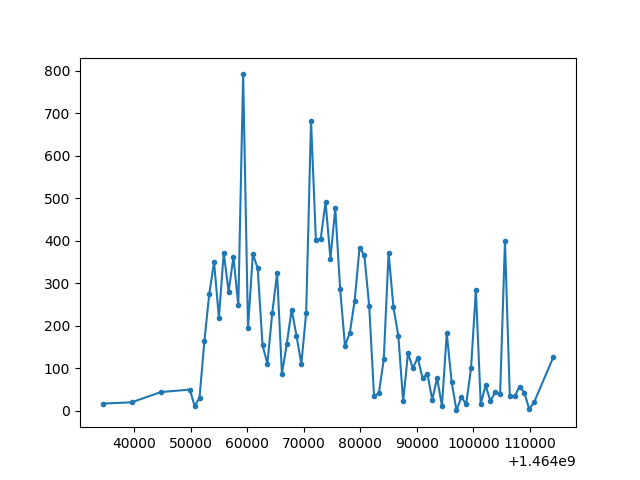

In [75]:
%matplotlib notebook
import matplotlib.pyplot as plt
#time_list = final_df['final_TS'].unique()

plt.plot(st['TIMESTAMP'],st['mean_VD'],marker = '.')

### every 3 min interval

<IPython.core.display.Javascript object>


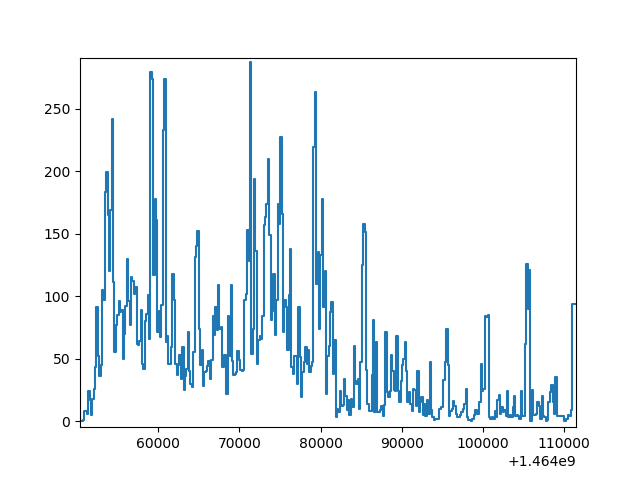

In [64]:
%matplotlib notebook

plt.step(st['TIMESTAMP'],st['mean_VD'])

<IPython.core.display.Javascript object>


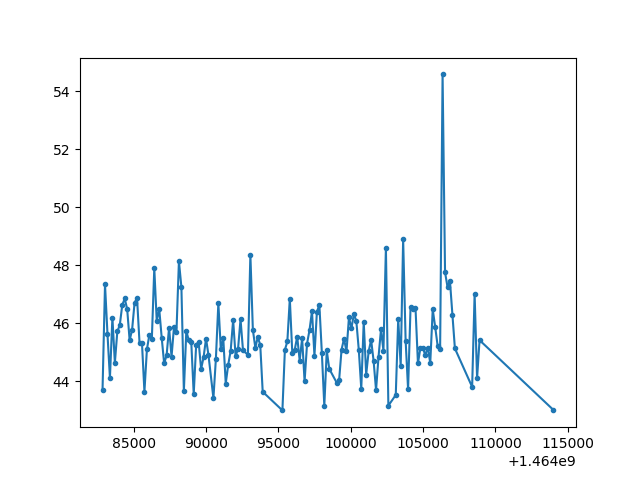

In [153]:
%matplotlib notebook
import matplotlib.pyplot as plt
time_list = stuv['final_TS'].unique()
plt.plot(time_list,st['mean_VD'],marker = '.')

<IPython.core.display.Javascript object>


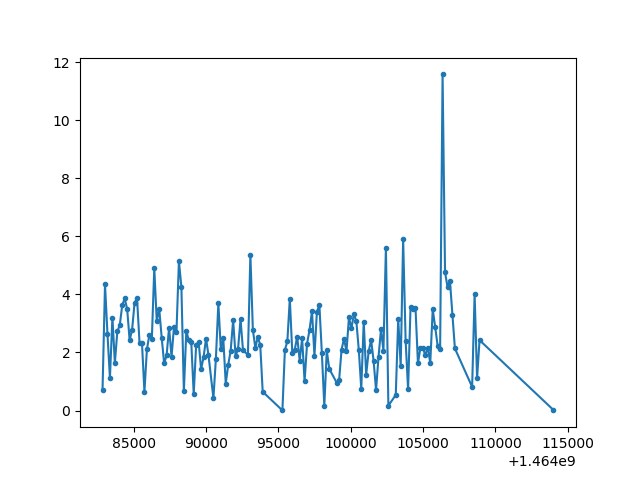

In [156]:
%matplotlib notebook
import matplotlib.pyplot as plt
time_list = stuv['final_TS'].unique()
plt.plot(time_list,st['mean_VD'],marker = '.')

In [144]:
st

,709616,501890,402371,702365,709753,709668,402799,514590,501906,514270,...,709695,403096,709899,709866,702671,702436,709477,502123,709776,702418
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.721037
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.347712
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.643219
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.123611
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.201389
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.638889
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.724346
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.943056
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.632108
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.861111
